In [2]:
# All libraries & Data points
import jetset
print('tested on jetset',jetset.__version__)
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from jetset.data_loader import Data
from jetset.data_loader import ObsData
from jetset.plot_sedfit import PlotSED
from jetset.jet_model import Jet
from jetset.minimizer import fit_SED,ModelMinimizer
from jetset.model_manager import  FitModel
from jetset.sed_shaper import  SEDShape
from jetset.obs_constrain import ObsConstrain
from jetset.minimizer import fit_SED
from jetset.template_2Dmodel import EBLAbsorptionTemplate
from jetset.mcmc import McmcSampler
sed_data=ObsData.load('J163547_data.pkl')
plt.rcParams['figure.dpi'] = 200

tested on jetset 1.2.2


# Unraveling the SMBH and its Nuclear Environment in NVSS J163547+362930 in the Early Universe

## Prefit obtained considering a SSD (see Prefit/Preprefit.ipynb) (trans -> blob)

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5


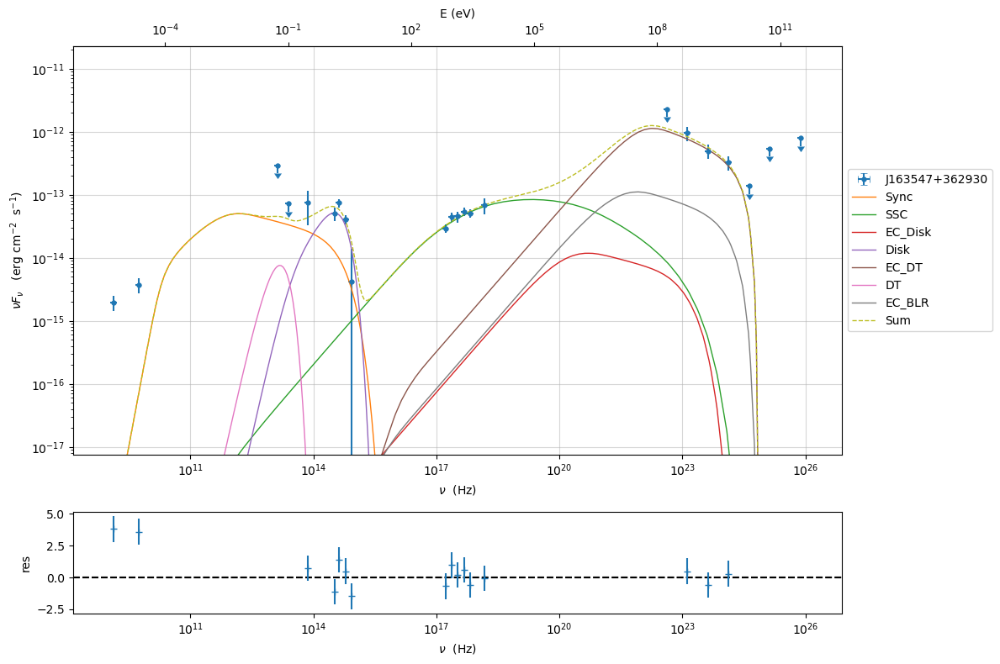

In [35]:
prefit_jet=Jet(name='jet_leptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
prefit_jet.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
prefit_jet.add_user_par(name='theta_open',val=3,units='deg')
prefit_jet.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
prefit_jet.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
prefit_jet.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
prefit_jet.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

R=7.861231E+016
R_H=1.500012E+018
B=0.05617886
NH_cold_to_rel_e=0.1
theta=3
BulkFactor=15.59751
z_cosm=3.647763
gmin=1
gmax=20000
N=1372.65
gamma_break=919.7911
p=1.503982
p_1=3.33144
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.083
M_BH=998159100
T_DT=871.8858
R_DT=2.350911E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=3.526366E+017
R_BLR_out=3.879003E+017
L_Disk=1.381695E+046
theta_open=3

prefit_jet.set_par('gmin',val=gmin)
prefit_jet.set_par('gmax',val=gmax)
prefit_jet.set_par('N',val=N)
prefit_jet.set_par('gamma_break',val=gamma_break)
prefit_jet.set_par('p',val=p)
prefit_jet.set_par('p_1',val=p_1)
prefit_jet.set_par('R_inner_Sw',val=R_inner_Sw)
prefit_jet.set_par('R_ext_Sw',val=R_ext_Sw)
prefit_jet.set_par('accr_eff',val=accr_eff)
prefit_jet.set_par('M_BH',val=M_BH)
prefit_jet.set_par('T_DT',val=T_DT)
prefit_jet.set_par('tau_DT',val=tau_DT)
prefit_jet.set_par('tau_BLR',val=tau_BLR)
prefit_jet.set_par('L_Disk',val=L_Disk)
prefit_jet.set_par('R_H',val=R_H)
prefit_jet.set_par('B',val=B)
prefit_jet.set_par('theta',val=theta)
prefit_jet.set_par('theta',val=theta_open)
prefit_jet.set_par('BulkFactor',val=BulkFactor)
prefit_jet.set_par('z_cosm',val=z_cosm)
prefit_jet.eval()
p=prefit_jet.plot_model(sed_data=sed_data, frame='obs')
p.add_residual_plot(prefit_jet,sed_data)

# Fitting with diff. $\eta$ values

# $\eta=0.057$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False



--------------------------------------------------------------------------------
model description: 
--------------------------------------------------------------------------------
type: Jet
name: jet_leptonic  

electrons distribution:
 type: bkn  
 gamma energy grid size:  201
 gmin grid : 1.000000e+00
 gmax grid : 2.000000e+04
 normalization:  True
 log-values:  False
 ratio of cold protons to relativistic electrons: 1.000000e-01

accretion disk:
 disk Type: MultiBB
 L disk: 9.671865e+45 (erg/s)
 T disk: 2.945923e+04 (K)
 nu peak disk: 2.407353e+15 (Hz)
 Sw radius 2.948102e+14 (cm)
 L Edd. 1.663655e+47 (erg/s)
 accr_rate: 2.993419e+00 (M_sun/yr)
 accr_rate Edd.: 5.148972e+01 (M_sun/yr)

radiative fields:
 seed photons grid size:  100
 IC emission grid size:  100
 source emissivity lower bound :  1.000000e-120
 spectral components:
   name:Sum, state: on
   name:Sync, state: self-abs
   name:SSC, state: on
   name:EC_Disk, state: on
   name:Disk, state: on
   name:EC_DT, state: on


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,5.700000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False


--------------------------------------------------------------------------------


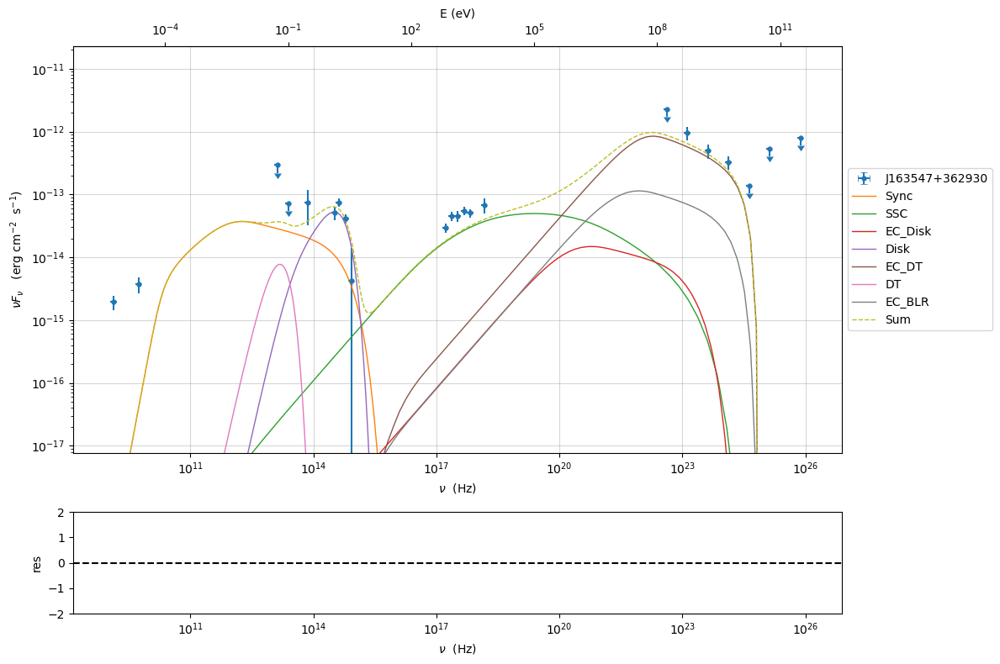

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 22

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.66000e+01

fit run: 1
- old chisq=3.66000e+01


0it [00:00, ?it/s]

- best chisq=3.64730e+01

fit run: 2
- old chisq=3.64730e+01


0it [00:00, ?it/s]

- best chisq=3.64578e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.057$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,1.502418e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,8.505113e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.436250e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.353143e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,5.700000e-02,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.050371e+09,0.000000e+00,--,False,False



converged=True
calls=799
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 36.46                      │              Nfcn = 799              │
│ EDM = 0.0609 (Goal: 0.0002)      │           time = 237.0 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │        No Parameters at limit        │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  1.502e3  │  0.023e3  │            │            │   100   │  2000   │       │
│ 1 │ par_1 │    851    │    21     │            │            │   500   │  2000   │       │
│ 2 │ par_2 │  1.4363   │  0.0013   │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │  3.3531   │  0.0027   │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │   1.1e9   │   1.1e9   │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │  9.82e45  │  0.23e45  │            │            │  5e+45  │  8e+46  │       │
│ 6 │ par_6 │ 1.2000e18 │ 0.0009e18 │            │            │  5e+17  │  3e+18  │       │
│ 7 │ par_7 │  0.0646   │  0.0010   │            │            │  0.02   │   0.1   │       │
│ 8 │ par_8 │   15.72   │   0.07    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │       524       482   -0.0296   -0.0556  2.66e+11  5.07e+45  1.95e+16    0.0236      1.47 │
│ par_1 │       482       452   -0.0275   -0.0517  2.47e+11  4.72e+45  1.81e+16    0.0219      1.37 │
│ par_2 │   -0.0296   -0.0275  1.74e-06  3.18e-06 -1.52e+07  -2.9e+41 -1.11e+12 -1.35e-06 -8.38e-05 │
│ par_3 │   -0.0556   -0.0517  3.18e-06  7.39e-06 -2.85e+07 -5.45e+41 -2.09e+12 -2.53e-06 -0.000158 │
│ par_4 │  2.66e+11  2.47e+11 -1.52e+07 -2.85e+07  1.36e+20   2.6e+54  9.99e+24  1.21e+07  7.53e+08 │
│ par_5 │  5.07e+45  4.72e+45  -2.9e+41 -5.45e+41   2.6e+54  5.12e+88  1.91e+59  2.31e+41  1.44e+43 │
│ par_6 │  1.95e+16  1.81e+16 -1.11e+12 -2.09e+12  9.99e+24  1.91e+59  7.45e+29  8.87e+11  5.52e+13 │
│ par_7 │    0.0236    0.0219 -1.35e-06 -2.53e-06  1.21e+07  2.31e+41  8.87e+11  1.09e-06  6.68e-05 │
│ par_8 │      1.47      1.37 -8.38e-05 -0.000158  7.53e+08  1.44e+43  5.52e+13  6.68e-05   0.00463 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=13
chisq=36.457758, chisq/red=2.804443 null hypothesis sig=0.000504

stats without the UL
dof  UL=7
chisq=36.345816, chisq/red=5.192259 null hypothesis sig=0.000006


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,1.502418e+03,1.502418e+03,2.289202e+01,--,1.372650e+03,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,8.505113e+02,8.505113e+02,2.124736e+01,--,9.197911e+02,5.000000e+02,2.000000e+03,False
jet_leptonic,p,1.436250e+00,1.436250e+00,1.320247e-03,--,1.503982e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.353143e+00,3.353143e+00,2.718790e-03,--,3.331440e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,1.015117e+01,--,--,--,1.015117e+01,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.930302e+02,--,--,--,8.930302e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,5.700000e-02,--,--,--,5.700000e-02,0.000000e+00,--,True
jet_leptonic,M_BH,1.050371e+09,1.050371e+09,1.091779e+09,--,9.981591e+08,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


there are  fit warnings messages, use  the .show_fit_warnings() or access the member .minimizer._post_fit_warnings
18.747794215557803


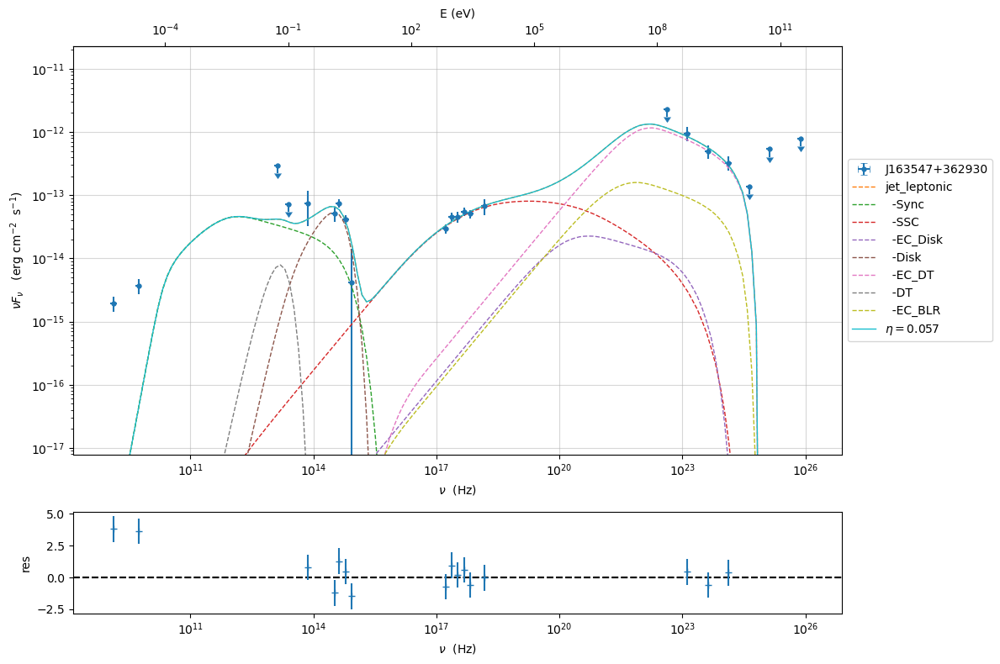

In [51]:
jet_5=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_2.pkl")

jet_5.set_par('accr_eff',val=0.057)
jet_5.set_par('L_Disk',val=L_Disk*0.7)
jet_5.set_par('R_H',val=R_H*0.8)
jet_5.set_par('B',val=B*1.2)

jet_5.eval()
jet_5.show_model()

p=jet_5.plot_model(sed_data=sed_data)
plt.show()

fit_model_5=FitModel(jet=jet_5, name=r'$\eta = 0.057$',template=None)

fit_model_5.free('jet_leptonic','R_H')
#fit_model_5.freeze('jet_leptonic','B')
fit_model_5.freeze('jet_leptonic','theta')
fit_model_5.freeze('jet_leptonic','theta_open')
#fit_model_5.freeze('jet_leptonic','BulkFactor')
fit_model_5.freeze('jet_leptonic','z_cosm')
fit_model_5.freeze('jet_leptonic','gmin')
fit_model_5.freeze('jet_leptonic','gmax')
#fit_model_5.freeze('jet_leptonic','N')
#fit_model_5.freeze('jet_leptonic','gamma_break')
#fit_model_5.freeze('jet_leptonic','p')
#fit_model_5.freeze('jet_leptonic','p_1')
fit_model_5.freeze('jet_leptonic','R_inner_Sw')
fit_model_5.freeze('jet_leptonic','R_ext_Sw')
fit_model_5.freeze('jet_leptonic','accr_eff')
#fit_model_5.freeze('jet_leptonic','M_BH')
fit_model_5.freeze('jet_leptonic','T_DT')
#fit_model_5.freeze('jet_leptonic','L_Disk')
fit_model_5.freeze('jet_leptonic','tau_BLR')
fit_model_5.freeze('jet_leptonic','tau_DT')

#fit_model_5.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_5.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_5.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_5.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,2.00e+03]
fit_model_5.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_5.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_5.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_5.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_5.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_5.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_5.jet_leptonic.parameters.L_Disk.fit_range=[5.00e45,8.00e46]
fit_model_5.jet_leptonic.parameters.R_H.fit_range=[5.00e17,3.00e18]
fit_model_5.jet_leptonic.parameters.B.fit_range=[0.020,0.100]
fit_model_5.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_5.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_5,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.057$',repeat=3, use_UL=True)
fit_model_5.eval()
#fit_model_5.show_model()
#fit_model_5.jet_leptonic.energetic_report()
best_fit_minuit.save_report('Report_best_fit_model_5_1.pkl')
fit_model_5.save_model('fit_model_5_1.pkl')
model_minimizer_minuit.save_model('model_minimizer_5_1.pkl')
p2=fit_model_5.plot_model(sed_data=sed_data)
#p2.save('fit_model_5.png')
print(fit_model_5.jet_leptonic.get_beaming())

# $\eta=0.100$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False



--------------------------------------------------------------------------------
model description: 
--------------------------------------------------------------------------------
type: Jet
name: jet_leptonic  

electrons distribution:
 type: bkn  
 gamma energy grid size:  201
 gmin grid : 1.000000e+00
 gmax grid : 2.000000e+04
 normalization:  True
 log-values:  False
 ratio of cold protons to relativistic electrons: 1.000000e-01

accretion disk:
 disk Type: MultiBB
 L disk: 1.934373e+46 (erg/s)
 T disk: 3.044021e+04 (K)
 nu peak disk: 2.487516e+15 (Hz)
 Sw radius 2.948102e+14 (cm)
 L Edd. 1.663655e+47 (erg/s)
 accr_rate: 3.412498e+00 (M_sun/yr)
 accr_rate Edd.: 2.934914e+01 (M_sun/yr)

radiative fields:
 seed photons grid size:  100
 IC emission grid size:  100
 source emissivity lower bound :  1.000000e-120
 spectral components:
   name:Sum, state: on
   name:Sync, state: self-abs
   name:SSC, state: on
   name:EC_Disk, state: on
   name:Disk, state: on
   name:EC_DT, state: on


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,1.000000e-01,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False


--------------------------------------------------------------------------------


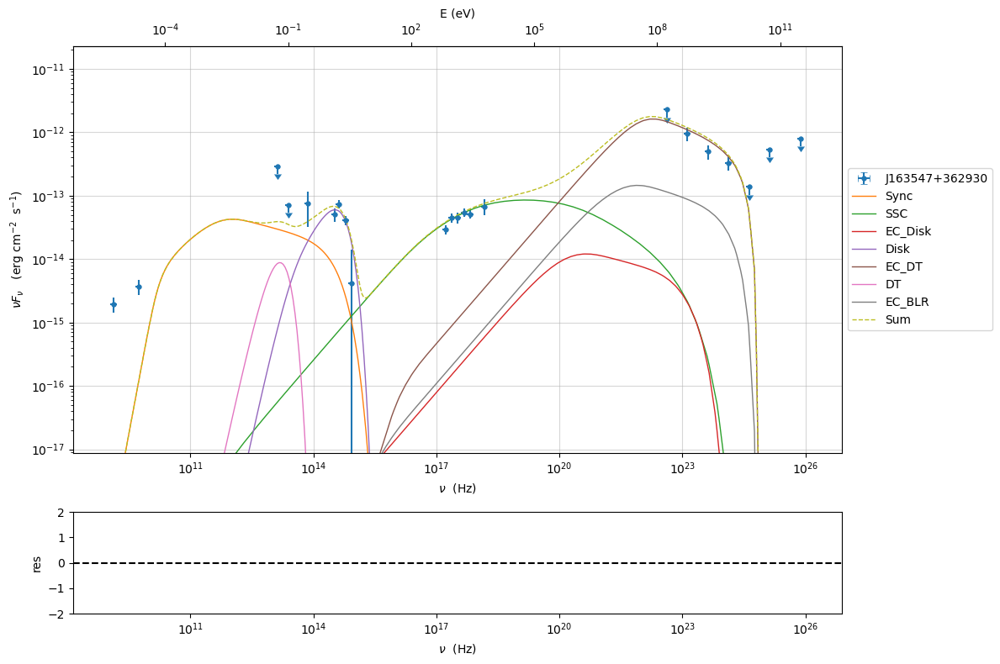

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 22

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.58836e+01

fit run: 1
- old chisq=3.58836e+01


0it [00:00, ?it/s]

- best chisq=3.58828e+01

fit run: 2
- old chisq=3.58828e+01


0it [00:00, ?it/s]

- best chisq=3.58217e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.100$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,1.144987e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.010035e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.487819e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.349215e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,1.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.049933e+09,0.000000e+00,--,False,False



converged=True
calls=942
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 35.82                      │              Nfcn = 942              │
│ EDM = 5.16 (Goal: 0.0002)        │           time = 280.0 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │   1.1e3   │   1.4e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │   1.0e3   │   1.5e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.49    │   0.14    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │    3.3    │    0.6    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │    1e9    │    1e9    │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │  0.02e48  │  0.04e48  │            │            │  5e+45  │  8e+46  │       │
│ 6 │ par_6 │  1.8e18   │  1.8e18   │            │            │  5e+17  │  3e+18  │       │
│ 7 │ par_7 │   0.04    │   0.05    │            │            │  0.02   │   0.1   │       │
│ 8 │ par_8 │    14     │     9     │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  9.74e+05 -3.53e+04      13.2     -3.14  5.73e+04 -2.45e+45 -2.58e+15     0.653       264 │
│ par_1 │ -3.53e+04  1.09e+06       3.9        31 -7.85e+04 -3.52e+44 -4.39e+14    -0.167      -121 │
│ par_2 │      13.2       3.9     0.015   0.00258     -6.28 -2.88e+41 -3.96e+11   0.00042     0.053 │
│ par_3 │     -3.14        31   0.00258     0.226     -32.7  9.15e+40  4.27e+11   -0.0004     0.341 │
│ par_4 │  5.73e+04 -7.85e+04     -6.28     -32.7  5.22e+17 -4.63e+45 -5.31e+15     -4.56    -0.562 │
│ par_5 │ -2.45e+45 -3.52e+44 -2.88e+41  9.15e+40 -4.63e+45  8.42e+92  4.75e+55  3.58e+40   5.7e+42 │
│ par_6 │ -2.58e+15 -4.39e+14 -3.96e+11  4.27e+11 -5.31e+15  4.75e+55  1.56e+36  2.05e+10  7.72e+12 │
│ par_7 │     0.653    -0.167   0.00042   -0.0004     -4.56  3.58e+40  2.05e+10   0.00128   0.00295 │
│ par_8 │       264      -121     0.053     0.341    -0.562   5.7e+42  7.72e+12   0.00295      46.1 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=13
chisq=35.821734, chisq/red=2.755518 null hypothesis sig=0.000632

stats without the UL
dof  UL=7
chisq=35.738619, chisq/red=5.105517 null hypothesis sig=0.000008


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,1.144987e+03,1.144987e+03,1.382248e+03,--,1.372650e+03,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.010035e+03,1.010035e+03,1.501893e+03,--,9.197911e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.487819e+00,1.487819e+00,1.427412e-01,--,1.503982e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.349215e+00,3.349215e+00,5.685770e-01,--,3.331440e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,1.015117e+01,--,--,--,1.015117e+01,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.930302e+02,--,--,--,8.930302e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,1.000000e-01,--,--,--,1.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.049933e+09,1.049933e+09,1.008132e+09,--,9.981591e+08,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


18.123460562453023


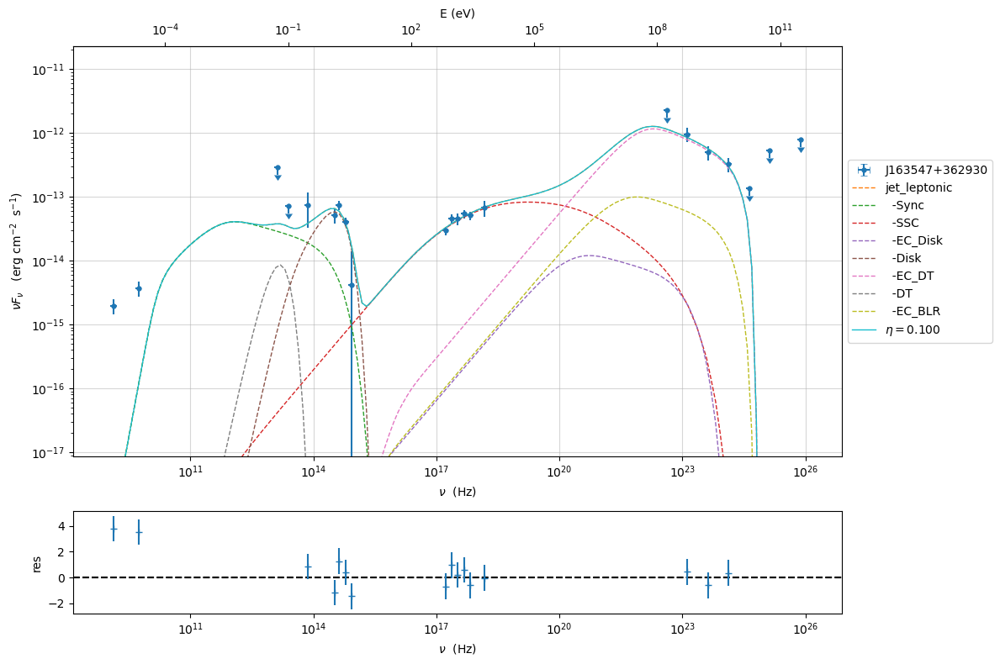

In [52]:
jet_1=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_2.pkl")

jet_1.set_par('accr_eff',val=0.100)
jet_1.set_par('L_Disk',val=L_Disk*1.4)
jet_1.set_par('R_H',val=R_H*1.2)
jet_1.set_par('B',val=B*0.7)

jet_1.eval()
jet_1.show_model()

p=jet_1.plot_model(sed_data=sed_data)
plt.show()

fit_model_1=FitModel(jet=jet_1, name=r'$\eta = 0.100$',template=None)

fit_model_1.free('jet_leptonic','R_H')
#fit_model_1.freeze('jet_leptonic','B')
fit_model_1.freeze('jet_leptonic','theta')
fit_model_1.freeze('jet_leptonic','theta_open')
#fit_model_1.freeze('jet_leptonic','BulkFactor')
fit_model_1.freeze('jet_leptonic','z_cosm')
fit_model_1.freeze('jet_leptonic','gmin')
fit_model_1.freeze('jet_leptonic','gmax')
#fit_model_1.freeze('jet_leptonic','N')
#fit_model_1.freeze('jet_leptonic','gamma_break')
#fit_model_1.freeze('jet_leptonic','p')
#fit_model_1.freeze('jet_leptonic','p_1')
fit_model_1.freeze('jet_leptonic','R_inner_Sw')
fit_model_1.freeze('jet_leptonic','R_ext_Sw')
fit_model_1.freeze('jet_leptonic','accr_eff')
#fit_model_1.freeze('jet_leptonic','M_BH')
fit_model_1.freeze('jet_leptonic','T_DT')
#fit_model_1.freeze('jet_leptonic','L_Disk')
fit_model_1.freeze('jet_leptonic','tau_BLR')
fit_model_1.freeze('jet_leptonic','tau_DT')

#fit_model_1.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_1.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_1.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_1.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_1.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_1.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_1.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_1.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_1.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_1.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_1.jet_leptonic.parameters.L_Disk.fit_range=[5.00e45,8.00e46]
fit_model_1.jet_leptonic.parameters.R_H.fit_range=[5.00e17,3.00e18]
fit_model_1.jet_leptonic.parameters.B.fit_range=[0.020,0.100]
fit_model_1.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_1.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_1,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.100$',repeat=3, use_UL=True)
fit_model_1.eval()
best_fit_minuit.save_report('Report_best_fit_model_1_2.pkl')
fit_model_1.save_model('fit_model_1_2.pkl')
model_minimizer_minuit.save_model('model_minimizer_1_2.pkl')
#fit_model_1.show_model()
#fit_model_1.jet_leptonic.energetic_report()
p2=fit_model_1.plot_model(sed_data=sed_data)
#p2.save('fit_model_1.png')
print(fit_model_1.jet_leptonic.get_beaming())

# $\eta=0.150$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False


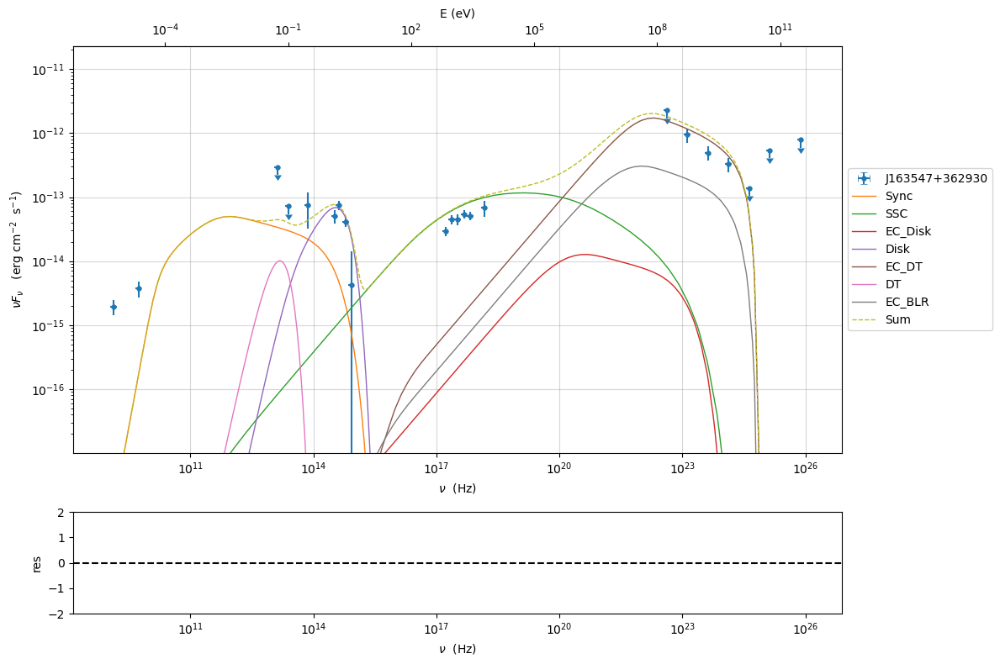

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 22

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.56227e+01

fit run: 1
- old chisq=3.56227e+01


0it [00:00, ?it/s]

- best chisq=3.56227e+01

fit run: 2
- old chisq=3.56227e+01


0it [00:00, ?it/s]

- best chisq=3.56227e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.150$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,1.194986e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.119911e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.499551e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.366139e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,1.500000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.318843e+09,0.000000e+00,--,False,False



converged=True
calls=378
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 35.62                      │              Nfcn = 378              │
│ EDM = 8.19 (Goal: 0.0002)        │           time = 112.2 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │        No Parameters at limit        │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  1.19e3   │  0.07e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │ 1.1199e3  │ 0.0025e3  │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.500   │   0.012   │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │   3.366   │   0.006   │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.319e9  │  0.009e9  │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │ 33.163e45 │ 0.007e45  │            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │2.10002e18 │0.00032e18 │            │            │  1e+18  │  3e+18  │       │
│ 7 │ par_7 │   0.027   │   0.005   │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │   12.8    │    2.7    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │   4.5e+03     -70.5    -0.206    -0.193 -7.06e+06 -2.72e+44 -1.25e+16    -0.241       102 │
│ par_1 │     -70.5      6.05    0.0149    0.0125  2.91e+05  1.29e+43  5.93e+14   0.00924     -5.09 │
│ par_2 │    -0.206    0.0149  0.000157  4.09e-05  1.49e+03  5.75e+40  2.65e+12  4.92e-05   -0.0217 │
│ par_3 │    -0.193    0.0125  4.09e-05  3.41e-05       802  3.54e+40  1.63e+12  2.54e-05    -0.014 │
│ par_4 │ -7.06e+06  2.91e+05  1.49e+03       802   8.1e+13   1.2e+48   5.5e+19       879 -4.67e+05 │
│ par_5 │ -2.72e+44  1.29e+43  5.75e+40  3.54e+40   1.2e+48   4.9e+85  2.25e+57  3.52e+40 -1.93e+43 │
│ par_6 │ -1.25e+16  5.93e+14  2.65e+12  1.63e+12   5.5e+19  2.25e+57  1.04e+29  1.62e+12 -8.89e+14 │
│ par_7 │    -0.241   0.00924  4.92e-05  2.54e-05       879  3.52e+40  1.62e+12  2.86e-05   -0.0139 │
│ par_8 │       102     -5.09   -0.0217    -0.014 -4.67e+05 -1.93e+43 -8.89e+14   -0.0139      7.76 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=13
chisq=35.622658, chisq/red=2.740204 null hypothesis sig=0.000679

stats without the UL
dof  UL=7
chisq=35.555313, chisq/red=5.079330 null hypothesis sig=0.000009


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,1.194986e+03,1.194986e+03,6.699494e+01,--,1.372650e+03,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.119911e+03,1.119911e+03,2.458865e+00,--,9.197911e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.499551e+00,1.499551e+00,1.251532e-02,--,1.503982e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.366139e+00,3.366139e+00,5.842907e-03,--,3.331440e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,1.015117e+01,--,--,--,1.015117e+01,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.930302e+02,--,--,--,8.930302e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,1.500000e-01,--,--,--,1.500000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.318843e+09,1.318843e+09,9.001839e+06,--,9.981591e+08,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


17.661896452493206


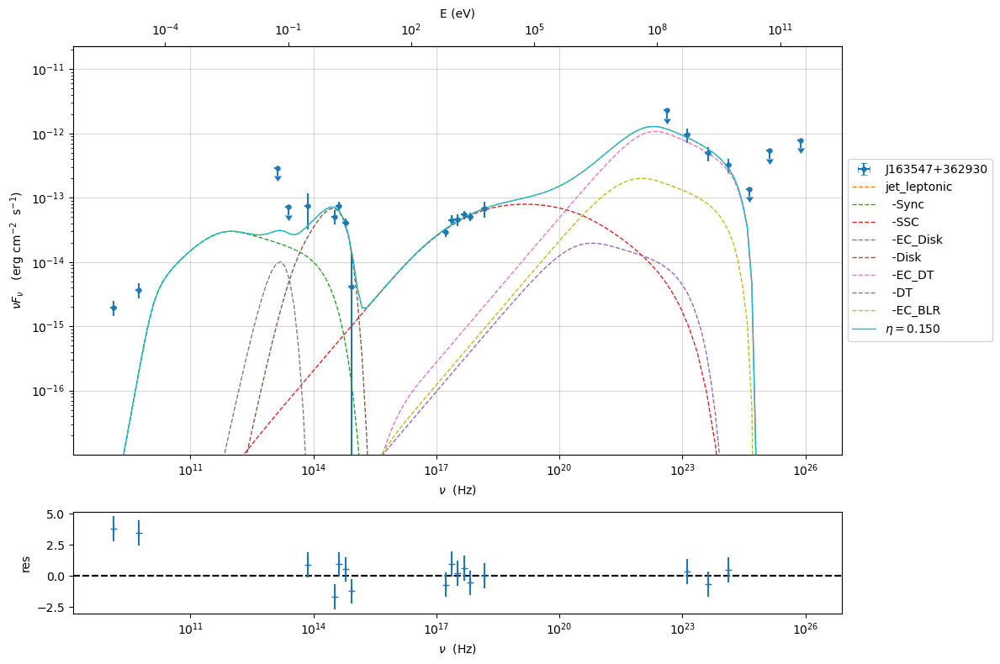

In [43]:
jet_1_5=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_2.pkl")

jet_1_5.set_par('accr_eff',val=0.150)
jet_1_5.set_par('L_Disk',val=L_Disk*2.4)
jet_1_5.set_par('R_H',val=R_H*1.4)
jet_1_5.set_par('B',val=B*0.6)

jet_1_5.eval()
#jet_1_5.show_model()

p=jet_1_5.plot_model(sed_data=sed_data)
plt.show()
#print(js)

fit_model_1_5=FitModel(jet=jet_1_5, name=r'$\eta = 0.150$',template=None)

fit_model_1_5.free('jet_leptonic','R_H')
fit_model_1_5.free('jet_leptonic','BulkFactor')
#fit_model_1_5.freeze('jet_leptonic','B')
fit_model_1_5.freeze('jet_leptonic','theta')
fit_model_1_5.freeze('jet_leptonic','theta_open')
#fit_model_1_5.freeze('jet_leptonic','BulkFactor')
fit_model_1_5.freeze('jet_leptonic','z_cosm')
fit_model_1_5.freeze('jet_leptonic','gmin')
fit_model_1_5.freeze('jet_leptonic','gmax')
#fit_model_1_5.freeze('jet_leptonic','N')
#fit_model_1_5.freeze('jet_leptonic','gamma_break')
#fit_model_1_5.freeze('jet_leptonic','p')
#fit_model_1_5.freeze('jet_leptonic','p_1')
fit_model_1_5.freeze('jet_leptonic','R_inner_Sw')
fit_model_1_5.freeze('jet_leptonic','R_ext_Sw')
fit_model_1_5.freeze('jet_leptonic','accr_eff')
#fit_model_1_5.freeze('jet_leptonic','M_BH')
fit_model_1_5.freeze('jet_leptonic','T_DT')
#fit_model_1_5.freeze('jet_leptonic','L_Disk')
fit_model_1_5.freeze('jet_leptonic','tau_BLR')
fit_model_1_5.freeze('jet_leptonic','tau_DT')

#fit_model_1_5.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_1_5.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_1_5.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_1_5.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_1_5.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_1_5.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_1_5.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_1_5.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_1_5.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_1_5.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_1_5.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_1_5.jet_leptonic.parameters.R_H.fit_range=[1.00e18,3.00e18]
fit_model_1_5.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_1_5.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_1_5.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_1_5,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.150$',repeat=3, use_UL=True)
fit_model_1_5.eval()
best_fit_minuit.save_report('Report_best_fit_model_1_5_2.pkl')
fit_model_1_5.save_model('fit_model_1_5_2.pkl')
model_minimizer_minuit.save_model('model_minimizer_1_5_2.pkl')
#fit_model_1_5.show_model()
#fit_model_1_5.jet_leptonic.energetic_report()
p2=fit_model_1_5.plot_model(sed_data=sed_data)
#p2.save('fit_model_1_5.png')
print(fit_model_1_5.jet_leptonic.get_beaming())

# $\eta=0.200$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False


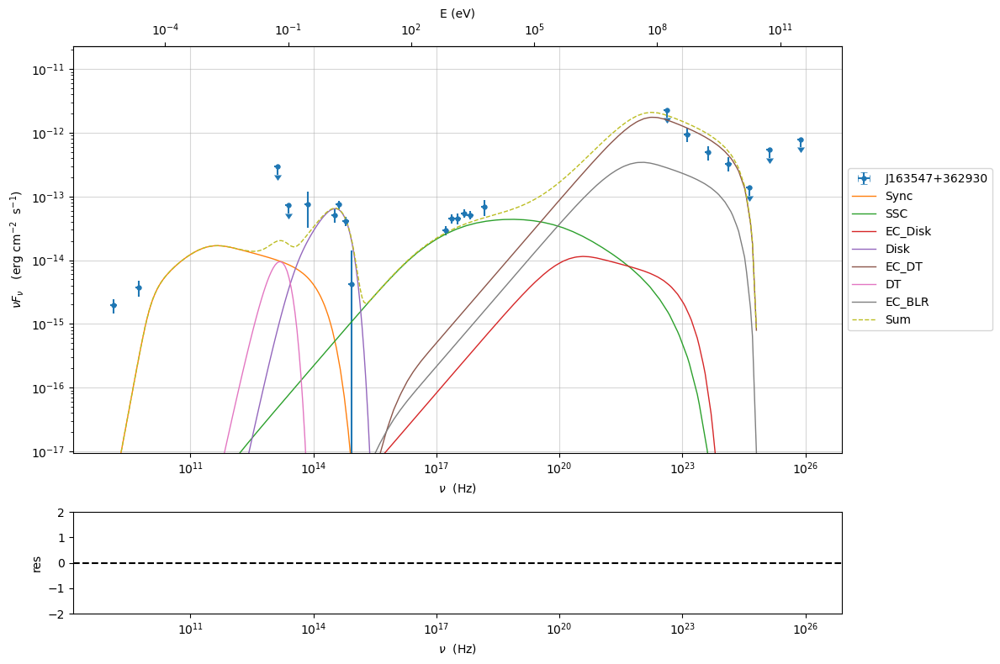

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 22

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.50493e+01

fit run: 1
- old chisq=3.50493e+01


0it [00:00, ?it/s]

- best chisq=3.50477e+01

fit run: 2
- old chisq=3.50477e+01


0it [00:00, ?it/s]

- best chisq=3.50212e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.200$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,1.020681e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.159201e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.466117e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.338589e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,2.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.157834e+09,0.000000e+00,--,False,False



converged=True
calls=663
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 35.02                      │              Nfcn = 663              │
│ EDM = 0.7 (Goal: 0.0002)         │           time = 197.2 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │        No Parameters at limit        │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  1.02e3   │  0.19e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │  1.16e3   │  0.23e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.466   │   0.028   │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │   3.34    │   0.12    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │   1.2e9   │   0.9e9   │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │41.4457e45 │ 0.0007e45 │            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │2.325000e18│0.000005e18│            │            │  1e+18  │  4e+18  │       │
│ 7 │ par_7 │  0.0211   │  0.0022   │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │   12.3    │    0.9    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  3.64e+04 -2.49e+04      2.57     -2.39   4.4e+10  1.22e+43  8.72e+13    -0.167      26.6 │
│ par_1 │ -2.49e+04  5.29e+04      1.26      9.45 -1.31e+11 -2.46e+43 -1.76e+14    0.0169     -89.1 │
│ par_2 │      2.57      1.26    0.0008   3.3e-05  2.92e+06 -4.16e+38 -2.97e+09  8.25e-06 -0.000463 │
│ par_3 │     -2.39      9.45   3.3e-05    0.0141 -3.57e+07  5.54e+39  3.97e+10 -5.93e-05    0.0304 │
│ par_4 │   4.4e+10 -1.31e+11  2.92e+06 -3.57e+07  3.11e+18  6.18e+49  4.43e+20  5.99e+04  4.05e+08 │
│ par_5 │  1.22e+43 -2.46e+43 -4.16e+38  5.54e+39  6.18e+49  4.45e+83  2.17e+54   3.2e+38 -1.59e+41 │
│ par_6 │  8.72e+13 -1.76e+14 -2.97e+09  3.97e+10  4.43e+20  2.17e+54  2.26e+25  2.29e+09 -1.14e+12 │
│ par_7 │    -0.167    0.0169  8.25e-06 -5.93e-05  5.99e+04   3.2e+38  2.29e+09  4.94e-06 -0.000241 │
│ par_8 │      26.6     -89.1 -0.000463    0.0304  4.05e+08 -1.59e+41 -1.14e+12 -0.000241     0.786 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=13
chisq=35.021151, chisq/red=2.693935 null hypothesis sig=0.000840

stats without the UL
dof  UL=7
chisq=34.967173, chisq/red=4.995310 null hypothesis sig=0.000011


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,1.020681e+03,1.020681e+03,1.894497e+02,--,1.372650e+03,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.159201e+03,1.159201e+03,2.282647e+02,--,9.197911e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.466117e+00,1.466117e+00,2.785668e-02,--,1.503982e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.338589e+00,3.338589e+00,1.168194e-01,--,3.331440e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,1.015117e+01,--,--,--,1.015117e+01,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.930302e+02,--,--,--,8.930302e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,2.000000e-01,--,--,--,2.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.157834e+09,1.157834e+09,9.309352e+08,--,9.981591e+08,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


17.37613929553981


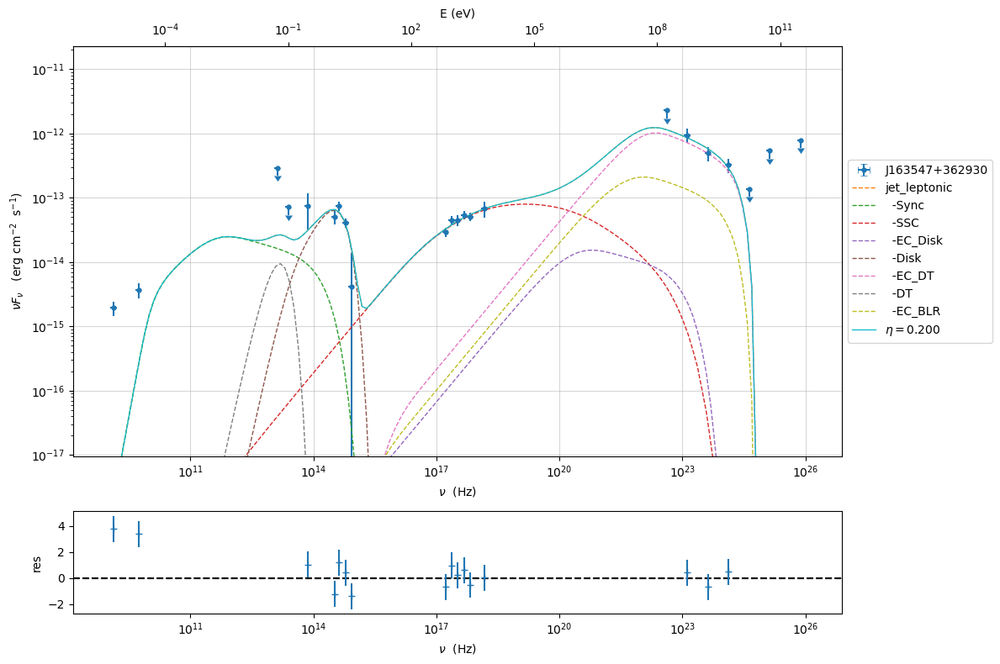

In [53]:
jet_2=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_2.pkl")

jet_2.set_par('accr_eff',val=0.200)
jet_2.set_par('L_Disk',val=L_Disk*3.)
jet_2.set_par('R_H',val=R_H*1.55)
jet_2.set_par('B',val=B*0.30)

jet_2.eval()
#jet_2.show_model()

p=jet_2.plot_model(sed_data=sed_data)
plt.show()
#print(js)

fit_model_2=FitModel(jet=jet_2, name=r'$\eta = 0.200$',template=None)

fit_model_2.free('jet_leptonic','R_H')
#fit_model_2.freeze('jet_leptonic','B')
fit_model_2.freeze('jet_leptonic','theta')
fit_model_2.freeze('jet_leptonic','theta_open')
#fit_model_2.freeze('jet_leptonic','BulkFactor')
fit_model_2.freeze('jet_leptonic','z_cosm')
fit_model_2.freeze('jet_leptonic','gmin')
fit_model_2.freeze('jet_leptonic','gmax')
#fit_model_2.freeze('jet_leptonic','N')
#fit_model_2.freeze('jet_leptonic','gamma_break')
#fit_model_2.freeze('jet_leptonic','p')
#fit_model_2.freeze('jet_leptonic','p_1')
fit_model_2.freeze('jet_leptonic','R_inner_Sw')
fit_model_2.freeze('jet_leptonic','R_ext_Sw')
fit_model_2.freeze('jet_leptonic','accr_eff')
#fit_model_2.freeze('jet_leptonic','M_BH')
fit_model_2.freeze('jet_leptonic','T_DT')
#fit_model_2.freeze('jet_leptonic','L_Disk')
fit_model_2.freeze('jet_leptonic','tau_BLR')
fit_model_2.freeze('jet_leptonic','tau_DT')

#fit_model_2.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_2.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_2.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_2.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_2.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_2.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_2.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_2.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_2.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_2.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_2.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_2.jet_leptonic.parameters.R_H.fit_range=[1.00e18,4.00e18]
fit_model_2.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_2.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_2.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_2,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.200$',repeat=3, use_UL=True)
fit_model_2.eval()
best_fit_minuit.save_report('Report_best_fit_model_2_2.pkl')
fit_model_2.save_model('fit_model_2_2.pkl')
model_minimizer_minuit.save_model('model_minimizer_2_2.pkl')
#fit_model_2.show_model()
#fit_model_2.jet_leptonic.energetic_report()
p2=fit_model_2.plot_model(sed_data=sed_data)
#p2.save('fit_model_2.png')
print(fit_model_2.jet_leptonic.get_beaming())

# $\eta=0.300$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,1.372650e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.197911e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.503982e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.331440e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,9.981591e+08,0.000000e+00,--,False,False


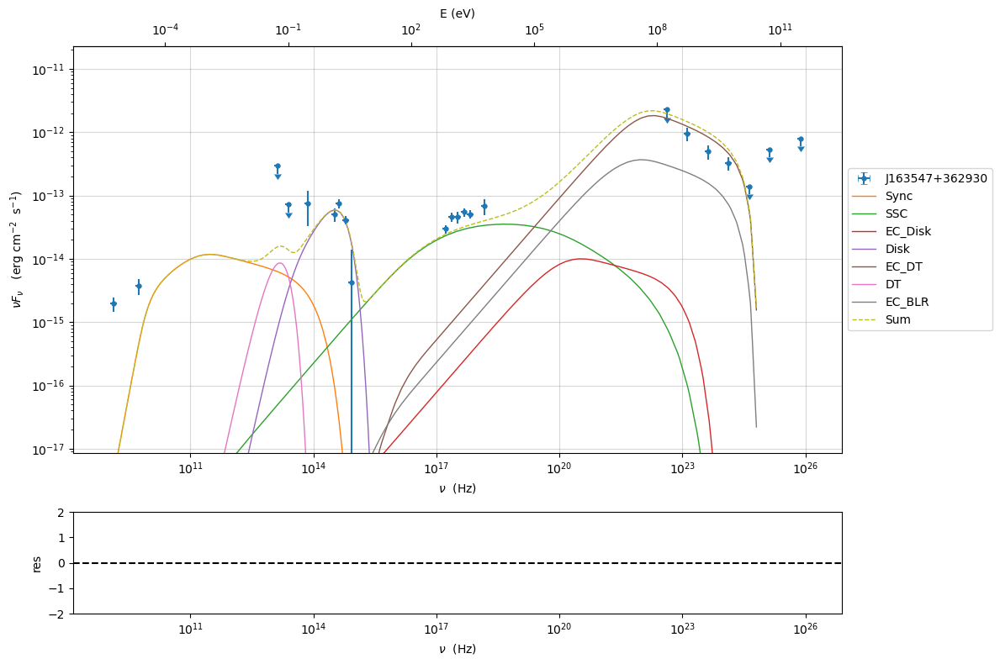

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 22

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.46439e+01

fit run: 1
- old chisq=3.46439e+01


0it [00:00, ?it/s]

- best chisq=3.46022e+01

fit run: 2
- old chisq=3.46022e+01


0it [00:00, ?it/s]

- best chisq=3.46006e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.300$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,9.017967e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.150764e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.580970e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.340992e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,1.015117e+01,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.930302e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,3.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.053813e+09,0.000000e+00,--,False,False



converged=True
calls=382
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 34.6                       │              Nfcn = 382              │
│ EDM = 0.0447 (Goal: 0.0002)      │           time = 116.3 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  0.90e3   │  0.32e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │   1.2e3   │   0.4e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.58    │   0.16    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │   3.34    │   0.28    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.05e9   │  0.31e9   │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │ 56.744e45 │ 0.005e45  │            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │2.70328e18 │0.00007e18 │            │            │  1e+18  │  4e+18  │       │
│ 7 │ par_7 │   0.029   │   0.008   │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │    15     │     4     │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  1.09e+05 -1.33e+04      16.5     -14.3 -1.04e+10  1.24e+44  1.77e+15     -0.93      -241 │
│ par_1 │ -1.33e+04  1.38e+05      6.48      39.1  -1.8e+10 -1.92e+44 -2.67e+15    -0.747      -367 │
│ par_2 │      16.5      6.48   0.00572   0.00202   3.6e+06 -2.25e+40 -3.25e+11  0.000182    0.0425 │
│ par_3 │     -14.3      39.1   0.00202    0.0945 -1.29e+07  -1.5e+41 -2.08e+12  8.12e-05     0.713 │
│ par_4 │ -1.04e+10  -1.8e+10   3.6e+06 -1.29e+07     1e+17 -1.28e+50    -2e+21  1.12e+06  2.44e+08 │
│ par_5 │  1.24e+44 -1.92e+44 -2.25e+40  -1.5e+41 -1.28e+50  2.34e+85  2.95e+56   4.2e+39 -1.11e+43 │
│ par_6 │  1.77e+15 -2.67e+15 -3.25e+11 -2.08e+12    -2e+21  2.95e+56  4.65e+27  5.69e+10 -1.57e+14 │
│ par_7 │     -0.93    -0.747  0.000182  8.12e-05  1.12e+06   4.2e+39  5.69e+10  7.12e-05    0.0141 │
│ par_8 │      -241      -367    0.0425     0.713  2.44e+08 -1.11e+43 -1.57e+14    0.0141      16.8 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=13
chisq=34.600594, chisq/red=2.661584 null hypothesis sig=0.000975

stats without the UL
dof  UL=7
chisq=34.499134, chisq/red=4.928448 null hypothesis sig=0.000014


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,9.017967e+02,9.017967e+02,3.239997e+02,--,1.372650e+03,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.150764e+03,1.150764e+03,3.645849e+02,--,9.197911e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.580970e+00,1.580970e+00,1.574008e-01,--,1.503982e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.340992e+00,3.340992e+00,2.774450e-01,--,3.331440e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,1.015117e+01,--,--,--,1.015117e+01,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.930302e+02,--,--,--,8.930302e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,3.000000e-01,--,--,--,3.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.053813e+09,1.053813e+09,3.062829e+08,--,9.981591e+08,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


18.553831037230925


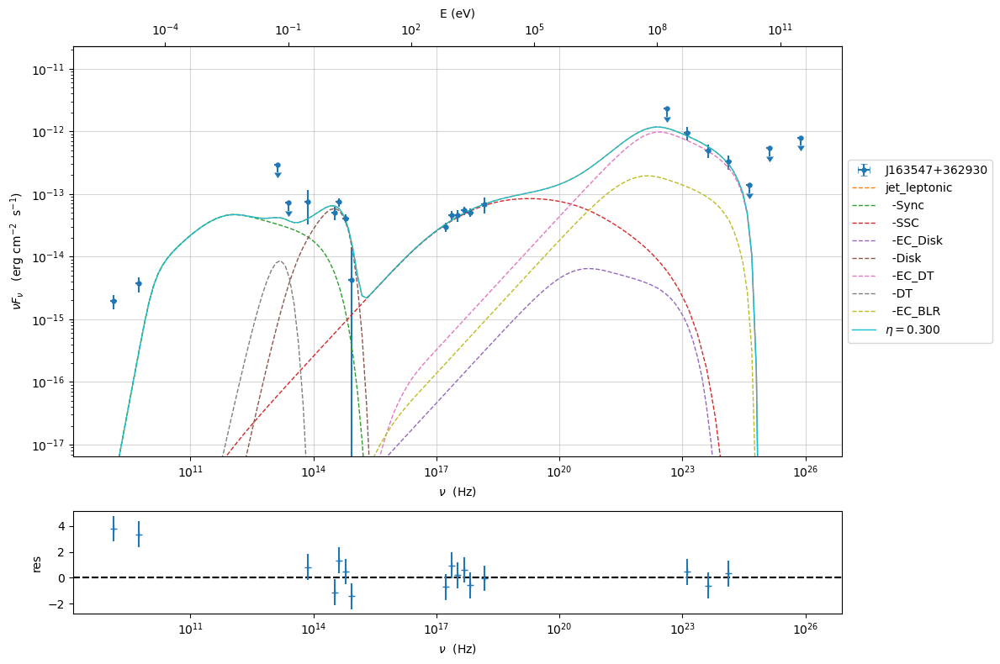

In [45]:
jet_3=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_2.pkl")

jet_3.set_par('accr_eff',val=0.300)
jet_3.set_par('L_Disk',val=L_Disk*4.1)
jet_3.set_par('R_H',val=R_H*1.8)
jet_3.set_par('B',val=B*0.20)

jet_3.eval()
#jet_3.show_model()

p=jet_3.plot_model(sed_data=sed_data)
plt.show()

fit_model_3=FitModel(jet=jet_3, name=r'$\eta = 0.300$',template=None)

fit_model_3.free('jet_leptonic','R_H')
#fit_model_3.freeze('jet_leptonic','B')
fit_model_3.freeze('jet_leptonic','theta')
fit_model_3.freeze('jet_leptonic','theta_open')
#fit_model_3.freeze('jet_leptonic','BulkFactor')
fit_model_3.freeze('jet_leptonic','z_cosm')
fit_model_3.freeze('jet_leptonic','gmin')
fit_model_3.freeze('jet_leptonic','gmax')
#fit_model_3.freeze('jet_leptonic','N')
#fit_model_3.freeze('jet_leptonic','gamma_break')
#fit_model_3.freeze('jet_leptonic','p')
#fit_model_3.freeze('jet_leptonic','p_1')
fit_model_3.freeze('jet_leptonic','R_inner_Sw')
fit_model_3.freeze('jet_leptonic','R_ext_Sw')
fit_model_3.freeze('jet_leptonic','accr_eff')
#fit_model_3.freeze('jet_leptonic','M_BH')
fit_model_3.freeze('jet_leptonic','T_DT')
#fit_model_3.freeze('jet_leptonic','L_Disk')
fit_model_3.freeze('jet_leptonic','tau_BLR')
fit_model_3.freeze('jet_leptonic','tau_DT')

#fit_model_3.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_3.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_3.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_3.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_3.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_3.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_3.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_3.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_3.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_3.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_3.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_3.jet_leptonic.parameters.R_H.fit_range=[1.00e18,4.00e18]
fit_model_3.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_3.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_3.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_3,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.300$',repeat=3, use_UL=True)
fit_model_3.eval()
best_fit_minuit.save_report('Report_best_fit_model_3_2.pkl')
fit_model_3.save_model('fit_model_3_2.pkl')
model_minimizer_minuit.save_model('model_minimizer_3_2.pkl')
#fit_model_3.show_model()
#fit_model_3.jet_leptonic.energetic_report()
p2=fit_model_3.plot_model(sed_data=sed_data)
#p2.save('fit_model_3.png')
print(fit_model_3.jet_leptonic.get_beaming())

# Comparing the models

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5

Beaming factor values:
η = 0.057 --> 18.748
η = 0.083 --> 18.719
η = 0.100 --> 18.123
η = 0.150 --> 17.662
η = 0.200 --> 17.376
η = 0.300 --> 18.554


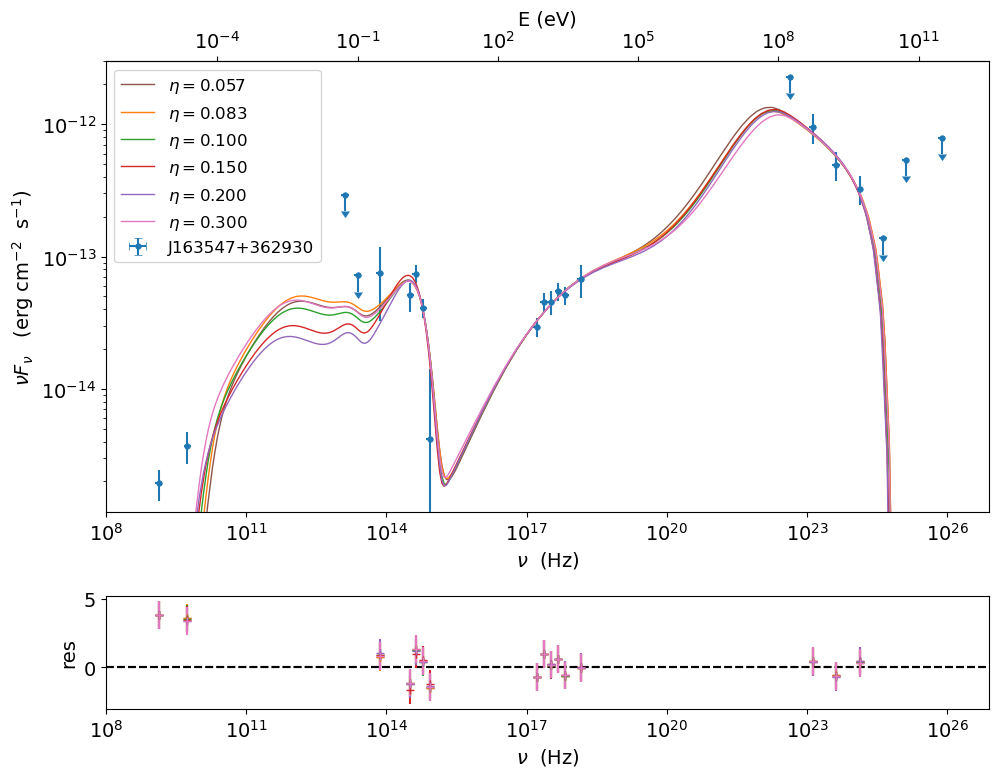

In [20]:
plt.rcParams.update({'font.size': 14})

sed_data=ObsData.load('J163547_data.pkl')
jet=Jet(name='jet_leptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
jet.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
jet.add_user_par(name='theta_open',val=3,units='deg')
jet.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
jet.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
jet.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
jet.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

gmin=1
gmax=20000
N5=1502.418
gamma_break=850.5113
p=1.43625
p_1=3.353143
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.057
M_BH5=1050371000
T_DT=871.8858
R_DT=1.982078E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=2.973116E+017
R_BLR_out=3.270428E+017
L_Disk5=9.821579E+045
R=6.288875E+016
R_H5=1.199989E+018
B5=0.06464289
NH_cold_to_rel_e=0.1
theta=3
BulkFactor5=15.71898
z_cosm=3.647763
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N5)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH5)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk5)
jet.set_par('R_H',val=R_H5)
jet.set_par('B',val=B5)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor5)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print("\nBeaming factor values:")
print('\u03B7 = 0.057 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(label=r'$\eta = 0.057$',comp='Sum', frame="obs", sed_data=sed_data, color='#8c564b')
my_plot.add_residual_plot(jet,sed_data,color='#8c564b')

R=7.861231E+016
R_H8=1.500012E+018
B8=0.05617886
NH_cold_to_rel_e=0.1
theta=3
BulkFactor8=15.59751
z_cosm=3.647763
gmin=1
gmax=20000
N8=1372.65
gamma_break=919.7911
p=1.503982
p_1=3.33144
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.083
M_BH8=998159100
T_DT=871.8858
R_DT=2.350911E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=3.526366E+017
R_BLR_out=3.879003E+017
L_Disk8=1.381695E+046
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N8)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH8)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk8)
jet.set_par('R_H',val=R_H8)
jet.set_par('B',val=B8)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor8)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.083 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.083$',comp='Sum', frame="obs",color='#ff7f0e')
my_plot.add_residual_plot(jet,sed_data, color='#ff7f0e')

gmin=1
gmax=20000
N1=1144.987
gamma_break=1010.035
p=1.487819
p_1=3.349215
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.1
M_BH1=1049933000
T_DT=871.8858
R_DT=2.738364E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=4.107546E+017
R_BLR_out=4.5183E+017
L_Disk1=1.874659E+046
R=9.459547E+016
R_H1=1.804989E+018
B1=0.04022697
NH_cold_to_rel_e=0.1
theta=3
BulkFactor1=13.77251
z_cosm=3.647763
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N1)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH1)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk1)
jet.set_par('R_H',val=R_H1)
jet.set_par('B',val=B1)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor1)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.100 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.100$',comp='Sum', frame="obs",color='#2ca02c')
my_plot.add_residual_plot(jet,sed_data,color='#2ca02c')


gmin=1
gmax=20000
N15=1194.986
gamma_break=1119.911
p=1.499551
p_1=3.366139
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.15
M_BH15=1318843000
T_DT=871.8858
R_DT=3.642131E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=5.463196E+017
R_BLR_out=6.009516E+017
L_Disk15=3.316279E+046
R=1.100574E+017
R_H15=2.10002E+018
B15=0.02716732
NH_cold_to_rel_e=0.1
theta=3
BulkFactor15=12.79502
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N15)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH15)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk15)
jet.set_par('R_H',val=R_H15)
jet.set_par('B',val=B15)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor15)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.150 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.150$',comp='Sum', frame="obs",color='#d62728')
my_plot.add_residual_plot(jet,sed_data, color='#d62728')

gmin=1
gmax=20000
N2=1020.681
gamma_break=1159.201
p=1.466117
p_1=3.338589
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.2
M_BH2=1157834000
T_DT=871.8858
R_DT=4.071645E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=6.107468E+017
R_BLR_out=6.718215E+017
L_Disk2=4.144574E+046
R=1.218481E+017
R_H2=2.325E+018
B2=0.02108893
NH_cold_to_rel_e=0.1
theta=3
BulkFactor2=12.28387
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N2)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH2)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk2)
jet.set_par('R_H',val=R_H2)
jet.set_par('B',val=B2)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor2)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.200 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.200$',comp='Sum', frame="obs",color='#9467bd')
my_plot.add_residual_plot(jet,sed_data,color='#9467bd')

gmin=1
gmax=20000
N3=901.7967
gamma_break=1150.764
p=1.58097
p_1=3.340992
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.3
M_BH3=1053813000
T_DT=871.8858
R_DT=4.764195E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=7.146292E+017
R_BLR_out=7.860921E+017
L_Disk3=5.674388E+046
R=1.41673E+017
R_H3=2.703282E+018
B3=0.02928403
NH_cold_to_rel_e=0.1
theta=3
BulkFactor3=14.98192
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N3)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH3)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk3)
jet.set_par('R_H',val=R_H3)
jet.set_par('B',val=B3)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor3)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.300 -->',np.round(jet.get_beaming(),3))
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.300$',comp='Sum', frame="obs", color="#e377c2")
my_plot.add_residual_plot(jet,sed_data,color="#e377c2")


my_plot.setlim(x_min=1e8,y_max=3.0e-12)
my_plot.sedplot.legend(loc='upper left',fontsize=12)
my_plot.sedplot.grid(False)
my_plot.save('etas_1.png')

# Zoom to the disc

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5


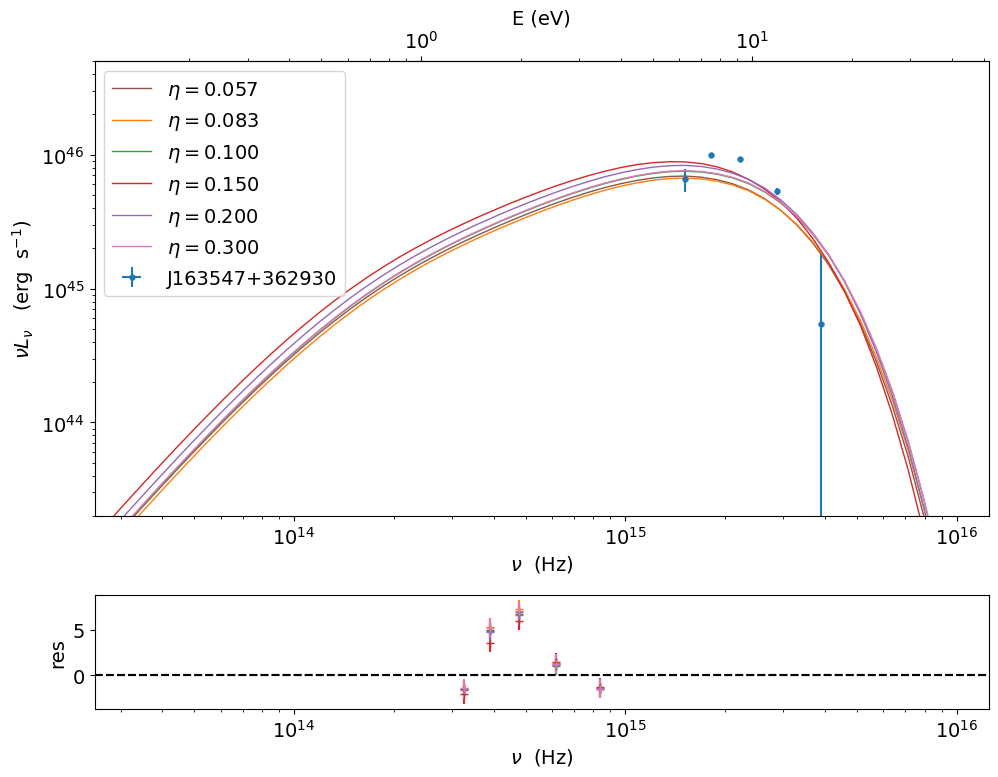

In [3]:
plt.rcParams.update({'font.size': 14})
d=np.genfromtxt('disk.txt')
data=Data(n_rows=d.shape[0])
data.set_field('x',d[:,0])
data.set_field('y',d[:,1])
data.set_field('dy',value=d[:,2])
data.set_meta_data('z',3.647763)
data.set_meta_data('restframe','obs')
data.set_meta_data('data_scale','lin-lin')
data.set_meta_data('obj_name','J163547+362930')
sed_data=ObsData(data_table=data)

my_disc=Jet(name='JetLeptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
my_disc.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
my_disc.add_user_par(name='theta_open',val=3,units='deg')
my_disc.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
my_disc.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
my_disc.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
my_disc.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

gmin=1
gmax=20000
N5=1502.418
gamma_break=850.5113
p=1.43625
p_1=3.353143
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.057
M_BH5=1050371000
T_DT=871.8858
R_DT=1.982078E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=2.973116E+017
R_BLR_out=3.270428E+017
L_Disk5=9.821579E+045
R=6.288875E+016
R_H5=1.199989E+018
B5=0.06464289
NH_cold_to_rel_e=0.1
theta=3
BulkFactor5=15.71898
z_cosm=3.647763
theta_open=3


my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N5)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH5)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk5)
my_disc.set_par('R_H',val=R_H5)
my_disc.set_par('B',val=B5)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor5)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(label=r'$\eta = 0.057$',comp='Disk', frame="src", sed_data=sed_data, color='#8c564b')
my_plot.add_residual_plot(my_disc,sed_data, color='#8c564b')

R=7.861231E+016
R_H8=1.500012E+018
B8=0.05617886
NH_cold_to_rel_e=0.1
theta=3
BulkFactor8=15.59751
z_cosm=3.647763
gmin=1
gmax=20000
N8=1372.65
gamma_break=919.7911
p=1.503982
p_1=3.33144
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.083
M_BH8=998159100
T_DT=871.8858
R_DT=2.350911E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=3.526366E+017
R_BLR_out=3.879003E+017
L_Disk8=1.381695E+046
theta_open=3


my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N8)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH8)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk8)
my_disc.set_par('R_H',val=R_H8)
my_disc.set_par('B',val=B8)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor8)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.083$',comp='Disk', frame="src",color='#ff7f0e')
my_plot.add_residual_plot(my_disc,sed_data,color='#ff7f0e' )

gmin=1
gmax=20000
N1=1144.987
gamma_break=1010.035
p=1.487819
p_1=3.349215
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.1
M_BH1=1049933000
T_DT=871.8858
R_DT=2.738364E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=4.107546E+017
R_BLR_out=4.5183E+017
L_Disk1=1.874659E+046
R=9.459547E+016
R_H1=1.804989E+018
B1=0.04022697
NH_cold_to_rel_e=0.1
theta=3
BulkFactor1=13.77251
z_cosm=3.647763
theta_open=3


my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N1)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH1)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk1)
my_disc.set_par('R_H',val=R_H1)
my_disc.set_par('B',val=B1)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor1)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.100$',comp='Disk', frame="src",color='#2ca02c')
my_plot.add_residual_plot(my_disc,sed_data,color='#2ca02c')


gmin=1
gmax=20000
N15=1194.986
gamma_break=1119.911
p=1.499551
p_1=3.366139
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.15
M_BH15=1318843000
T_DT=871.8858
R_DT=3.642131E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=5.463196E+017
R_BLR_out=6.009516E+017
L_Disk15=3.316279E+046
R=1.100574E+017
R_H15=2.10002E+018
B15=0.02716732
NH_cold_to_rel_e=0.1
theta=3
BulkFactor15=12.79502
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N15)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH15)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk15)
my_disc.set_par('R_H',val=R_H15)
my_disc.set_par('B',val=B15)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor15)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.150$',comp='Disk', frame="src",color='#d62728')
my_plot.add_residual_plot(my_disc,sed_data,color='#d62728')

gmin=1
gmax=20000
N2=1020.681
gamma_break=1159.201
p=1.466117
p_1=3.338589
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.2
M_BH2=1157834000
T_DT=871.8858
R_DT=4.071645E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=6.107468E+017
R_BLR_out=6.718215E+017
L_Disk2=4.144574E+046
R=1.218481E+017
R_H2=2.325E+018
B2=0.02108893
NH_cold_to_rel_e=0.1
theta=3
BulkFactor2=12.28387
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N2)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH2)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk2)
my_disc.set_par('R_H',val=R_H2)
my_disc.set_par('B',val=B2)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor2)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.200$',comp='Disk', frame="src",color='#9467bd')
my_plot.add_residual_plot(my_disc,sed_data,color='#9467bd')

gmin=1
gmax=20000
N3=901.7967
gamma_break=1150.764
p=1.58097
p_1=3.340992
R_inner_Sw=10.15117
R_ext_Sw=893.0302
accr_eff=0.3
M_BH3=1053813000
T_DT=871.8858
R_DT=4.764195E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=7.146292E+017
R_BLR_out=7.860921E+017
L_Disk3=5.674388E+046
R=1.41673E+017
R_H3=2.703282E+018
B3=0.02928403
NH_cold_to_rel_e=0.1
theta=3
BulkFactor3=14.98192
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N3)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH3)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk3)
my_disc.set_par('R_H',val=R_H3)
my_disc.set_par('B',val=B3)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor3)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.300$',comp='Disk', frame="src", color="#e377c2")
my_plot.add_residual_plot(my_disc,sed_data,color="#e377c2")
my_plot.setlim(x_min=2.50e13, x_max=1.25e16, y_min=2e43, y_max=5e46)
my_plot.sedplot.grid(False)
my_plot.sedplot.legend(loc='upper left',fontsize=14)
my_plot.save('disk_diff.png')

## SMBH Evolution

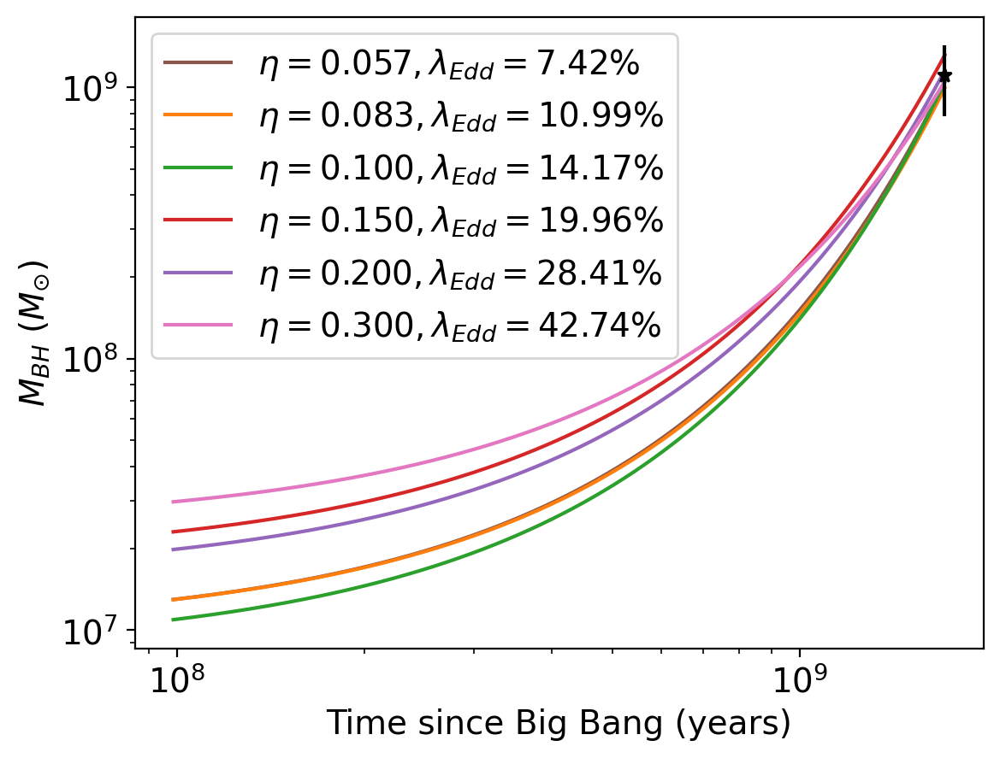

In [25]:
import numpy as np
eta=np.array([0.057,0.083,0.100,0.150,0.200,0.300])
L=np.array([L_Disk5,L_Disk8,L_Disk1,L_Disk15,L_Disk2,L_Disk3])
M_now=np.array([M_BH5,M_BH8,M_BH1,M_BH15,M_BH2,M_BH3])

L_Edd = (1.26e38)*M_now
ratio = L/L_Edd

tau = 0.45*(eta/(1-eta))*(1/ratio)*1e9 # Belladitta 2022; Shapiro 2005; Volonteri & Rees 2005

z30 = int(9.864900E+07) #Using the calculator https://www.astro.ucla.edu/~wright/CosmoCalc.html & Planck 2018
z3  = int(1.710e+09)

M_seed = M_now*np.exp((z30-z3)/tau)

t = np.linspace(z30,z3,1000) 

M = np.zeros((len(M_now),len(t)))
for i in range(len(M_now)):
    for j in range(len(t)):
        if j==0:
            M[i][j] = M_seed[i]            
        b = np.exp((j*(z3-z30)/1000)/(tau[i]))
        M[i][j] = M_seed[i]*(b)

        
plt.loglog(t,M[0], label=fr"$\eta={eta[0]:.3f}, \lambda_{{Edd}}={ratio[0]*100:.2f}\%$", color='#8c564b')
plt.loglog(t,M[1], label=fr"$\eta={eta[1]:.3f}, \lambda_{{Edd}}={ratio[1]*100:.2f}\%$", color='#ff7f0e')
plt.loglog(t,M[2], label=fr"$\eta={eta[2]:.3f}, \lambda_{{Edd}}={ratio[2]*100:.2f}\%$", color='#2ca02c')
plt.loglog(t,M[3], label=fr"$\eta={eta[3]:.3f}, \lambda_{{Edd}}={ratio[3]*100:.2f}\%$", color='#d62728')
plt.loglog(t,M[4], label=fr"$\eta={eta[4]:.3f}, \lambda_{{Edd}}={ratio[4]*100:.2f}\%$", color='#9467bd')
plt.loglog(t,M[5], label=fr"$\eta={eta[5]:.3f}, \lambda_{{Edd}}={ratio[5]*100:.2f}\%$", color='#e377c2')
plt.errorbar(z3,np.mean(M_now),yerr=np.std(M_now)*3, marker="*", color="k")
#plt.ylim(2e7, 2e10)
plt.xlabel("Time since Big Bang (years)")
plt.ylabel(r"$M_{BH}$ ($M_{\odot}$)")
plt.legend()
plt.savefig('BH_evolution.png')
plt.show()

## B vs $R_{{diss}}$

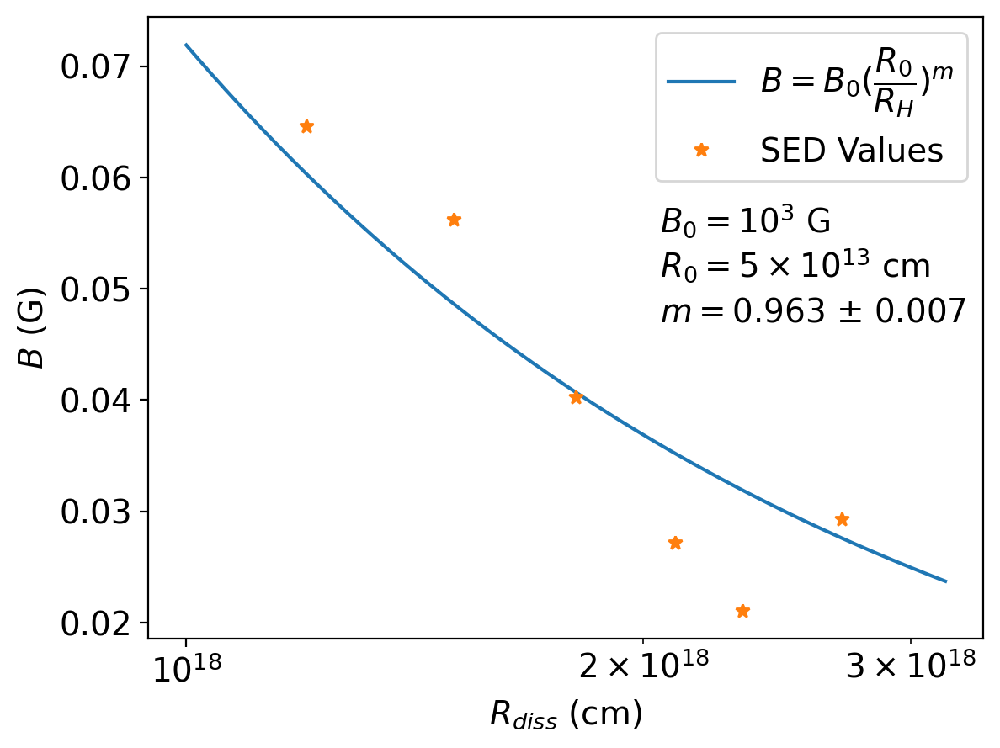

In [35]:
from scipy.optimize import curve_fit

def func(x,m):
    return 1e3*(5e13/x)**(m)

x = np.array([R_H5,R_H8,R_H1,R_H15,R_H2,R_H3])
y = np.array([B5,B8,B1,B15,B2,B3])

param, pcov = curve_fit(func, x, y, bounds=([0.90], [1.2]))

x2 = np.logspace(18,18.5,1000)
ans = func(x2,param[0])
m = np.round(param[0],3)
plt.plot(x2,ans,label=fr'$B=B_0(\dfrac{{R_0}}{{R_{{H}}}})^{{m}}$')
plt.plot(x,y,"*",label="SED Values")
plt.xscale('log')
plt.text(2.05e18,5.5e-2, r'$B_{0} = 10^{{3}}$ G')
plt.text(2.05e18,5.1e-2, r'$R_{0} = 5\times10^{{13}}$ cm')
plt.text(2.05e18,4.7e-2, fr'$m = {np.round(param[0],3)}$ $\pm$ {np.round(np.sqrt(float(np.diag(pcov))),3)}')
#plt.arrow(x=1.1e18, y=0.018, dx=1.6e18, dy=0.0, width=.0008, color="k", head_length = 1e17) 
#plt.annotate(r'$\eta$', xy = (1.7e18, 0.02))
plt.xlabel(r"$R_{{diss}}$ (cm)")
plt.ylabel(r"$B$ (G)")
plt.legend()
plt.savefig('BvR_H.png',bbox_inches='tight')
plt.show()

## Electron distribution

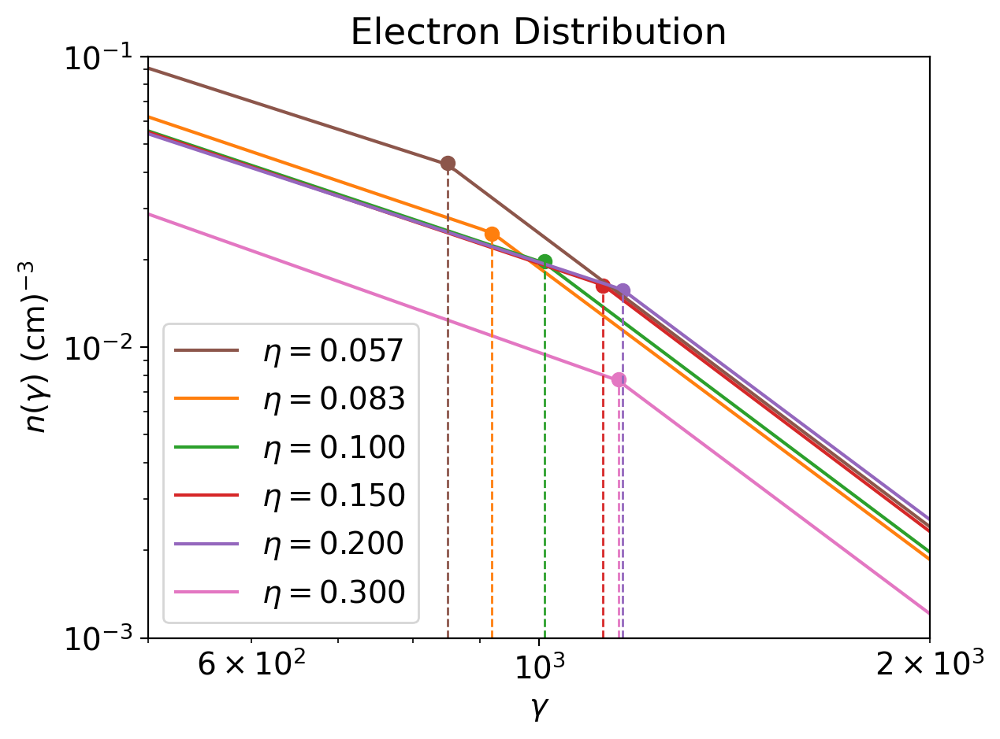

In [225]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad

gmin=1
gmax=20000

N5=1502.418
g_break5=850.5113
p5=1.43625
p_1_5=3.353143


N8=1372.65
g_break8=919.7911
p8=1.503982
p_1_8=3.33144


N1=1144.987
g_break1=1010.035
p1=1.487819
p_1_1=3.349215


N15=1194.986
g_break15=1119.911
p15=1.499551
p_1_15=3.366139


N2=1020.681
g_break2=1159.201
p2=1.466117
p_1_2=3.338589


N3=901.7967
g_break3=1150.764
p3=1.58097
p_1_3=3.340992

c5='#8c564b'
c8='#ff7f0e'
c1='#2ca02c'
c15='#d62728'
c2='#9467bd'
c3='#e377c2'

def broken_power_law(x, alpha1, alpha2, x_break):
    y = np.where(x < x_break, x ** (-alpha1), x_break ** (-(alpha1 - alpha2)) * x ** (-alpha2))
    return y

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

x = np.linspace(gmin, gmax, 1000)
I5 = quad(broken_power_law, gmin, gmax, args=(p5,p_1_5,g_break5))
y_5 = N5*broken_power_law(x,p5, p_1_5, g_break5)/I5[0]

I8 = quad(broken_power_law, gmin, gmax, args=(p8,p_1_8,g_break8))
y_8 = N8*broken_power_law(x,p8, p_1_8, g_break8)/I8[0]

I1 = quad(broken_power_law, gmin, gmax, args=(p1,p_1_1,g_break1))
y_1 = N1*broken_power_law(x,p1, p_1_1, g_break1)/I1[0]

I15 = quad(broken_power_law, gmin, gmax, args=(p15,p_1_15,g_break15))
y_15 = N15*broken_power_law(x,p15, p_1_15, g_break15)/I15[0]

I2 = quad(broken_power_law, gmin, gmax, args=(p2,p_1_2,g_break2))
y_2 = N2*broken_power_law(x,p2, p_1_2, g_break2)/I2[0]

I3 = quad(broken_power_law, gmin, gmax, args=(p3,p_1_3,g_break3))
y_3 = N3*broken_power_law(x,p3, p_1_3, g_break3)/I3[0]

plt.plot(x, y_5, label=r'$\eta=0.057$', color=c5)
plt.plot(x, y_8, label=r'$\eta=0.083$', color=c8)
plt.plot(x, y_1, label=r'$\eta=0.100$', color=c1)
plt.plot(x, y_15, label=r'$\eta=0.150$', color=c15)
plt.plot(x, y_2, label=r'$\eta=0.200$', color=c2)
plt.plot(x, y_3, label=r'$\eta=0.300$', color=c3)
plt.xlabel(r'$\gamma$')
plt.ylabel(r'$n(\gamma)$ (cm)$^{-3}$')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-3,1e-1)
plt.xlim(5e2,2e3)
plt.scatter(g_break5,y_5[find_nearest(x,g_break5)], color=c5)
plt.scatter(g_break8,y_8[find_nearest(x,g_break8)], color=c8)
plt.scatter(g_break1,y_1[find_nearest(x,g_break1)], color=c1)
plt.scatter(g_break15,y_15[find_nearest(x,g_break15)], color=c15)
plt.scatter(g_break2,y_2[find_nearest(x,g_break2)], color=c2)
plt.scatter(g_break3,y_3[find_nearest(x,g_break3)], color=c3)
plt.vlines(x=g_break5,ymin=1e-3,ymax=y_5[find_nearest(x,g_break5)], color=c5, linestyle='--', linewidth=1.0)
plt.vlines(x=g_break8,ymin=1e-3,ymax=y_8[find_nearest(x,g_break8)], color=c8, linestyle='--', linewidth=1.0)
plt.vlines(x=g_break1,ymin=1e-3,ymax=y_1[find_nearest(x,g_break1)], color=c1, linestyle='--', linewidth=1.0)
plt.vlines(x=g_break15,ymin=1e-3,ymax=y_15[find_nearest(x,g_break15)],color=c15,linestyle='--',linewidth=1.0)
plt.vlines(x=g_break2,ymin=1e-3,ymax=y_2[find_nearest(x,g_break2)], color=c2, linestyle='--', linewidth=1.0)
plt.vlines(x=g_break3,ymin=1e-3,ymax=y_3[find_nearest(x,g_break3)], color=c3, linestyle='--', linewidth=1.0)
plt.legend()
plt.title('Electron Distribution')
plt.savefig('ED.png',bbox_inches='tight', dpi=200)
plt.show()

# MCMC
# steps=75, bound=5.0 for all $\eta$

## $\eta=0.057$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2513.50 seconds


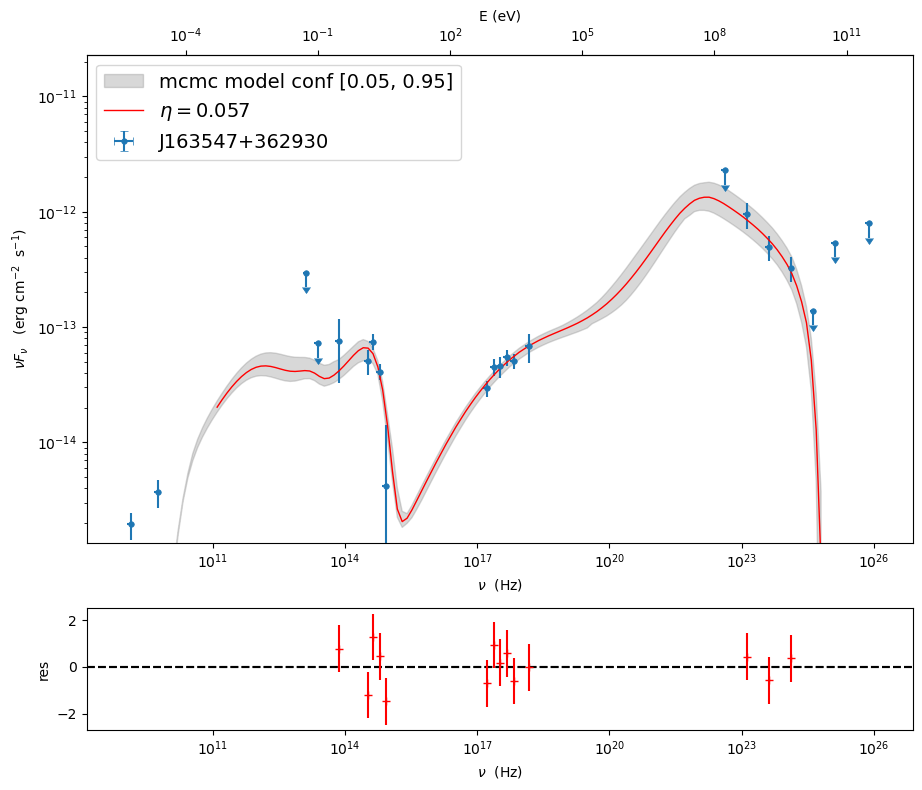

In [54]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_5_1.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)

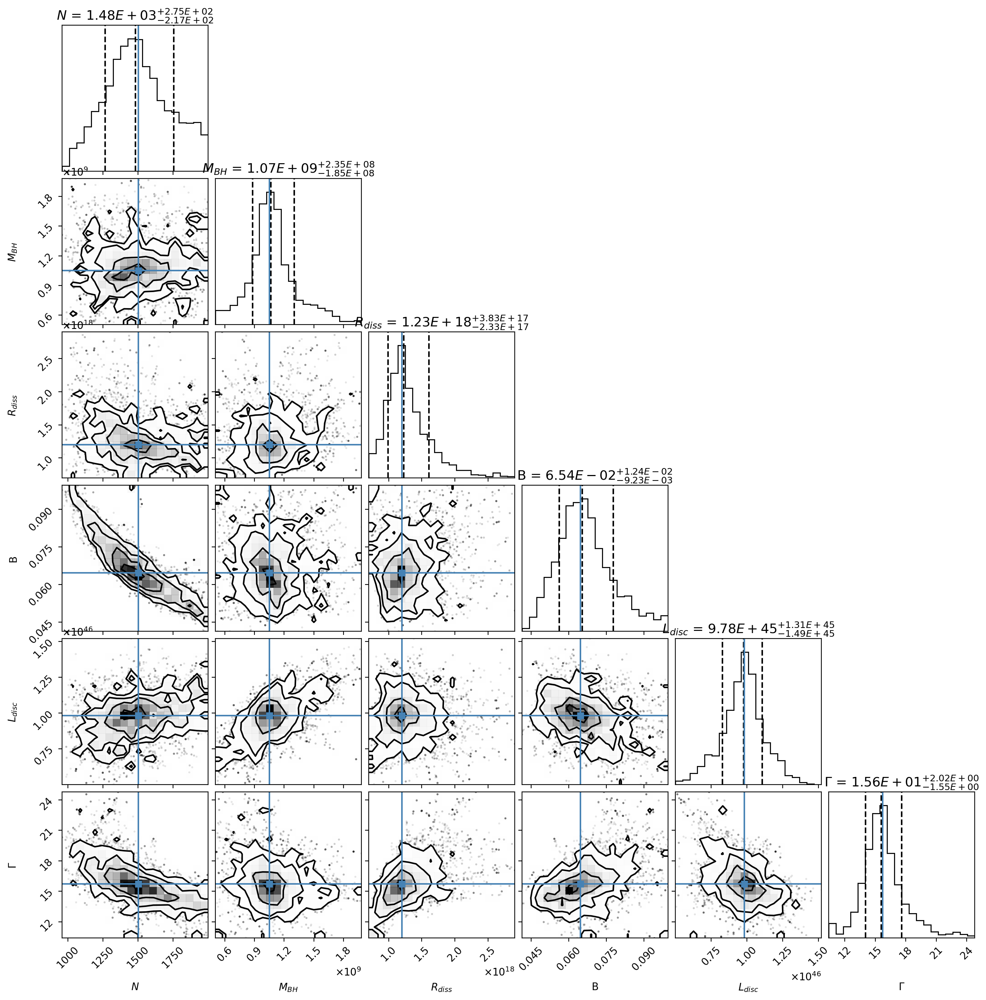

In [55]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_5_1.pkl')

# $\eta=0.083$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2526.56 seconds


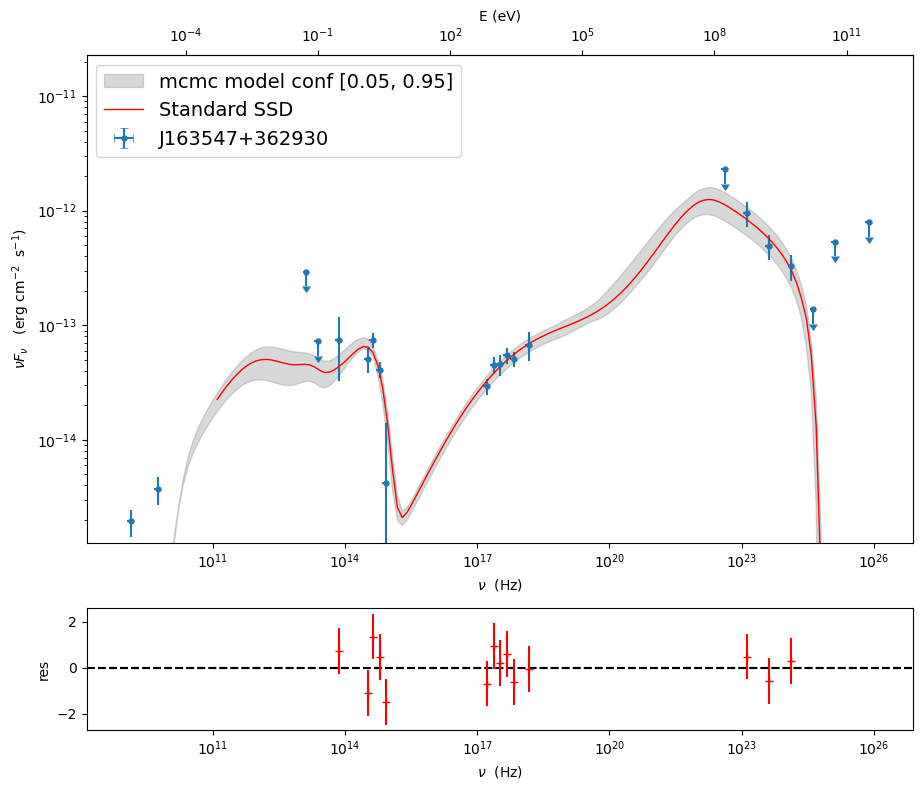

In [56]:
model_minimizer_minuit = ModelMinimizer.load_model('/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/model_minimizer_PrePre_2.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

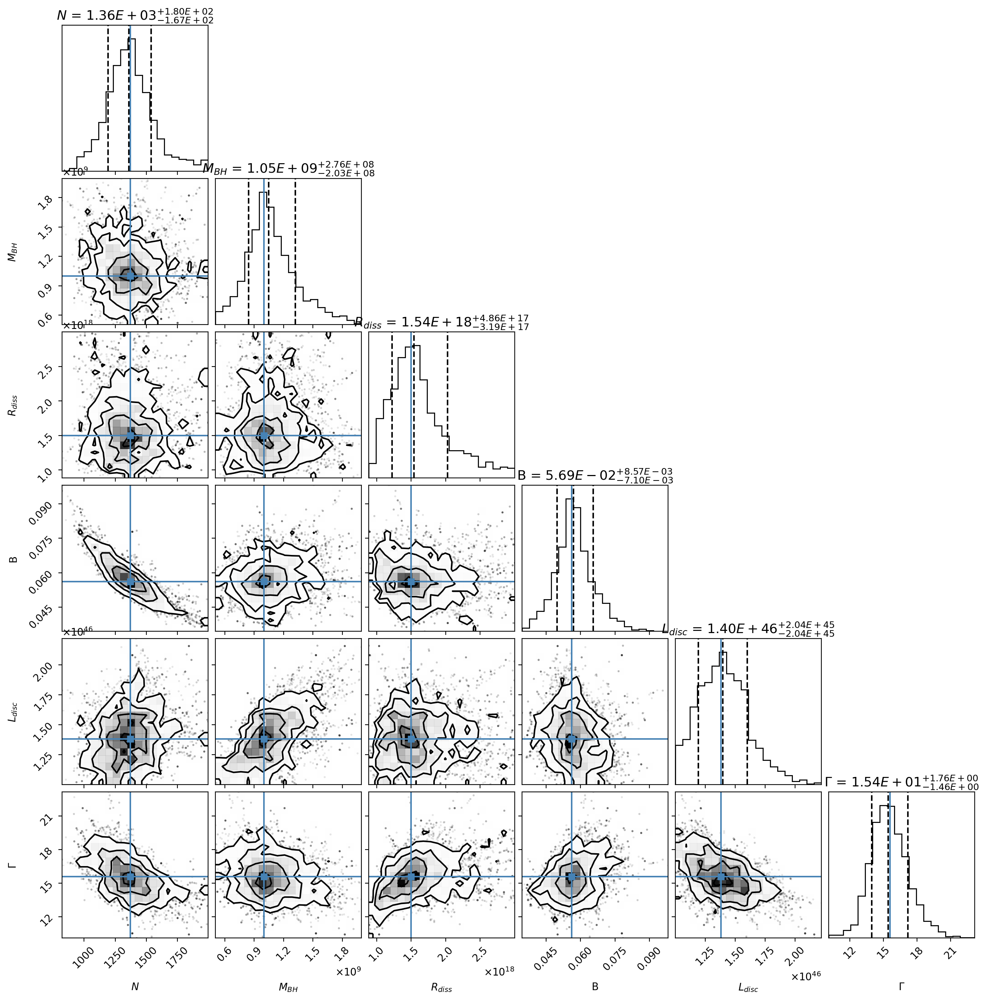

In [57]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_8_1.pkl')

# $\eta=0.100$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2548.54 seconds


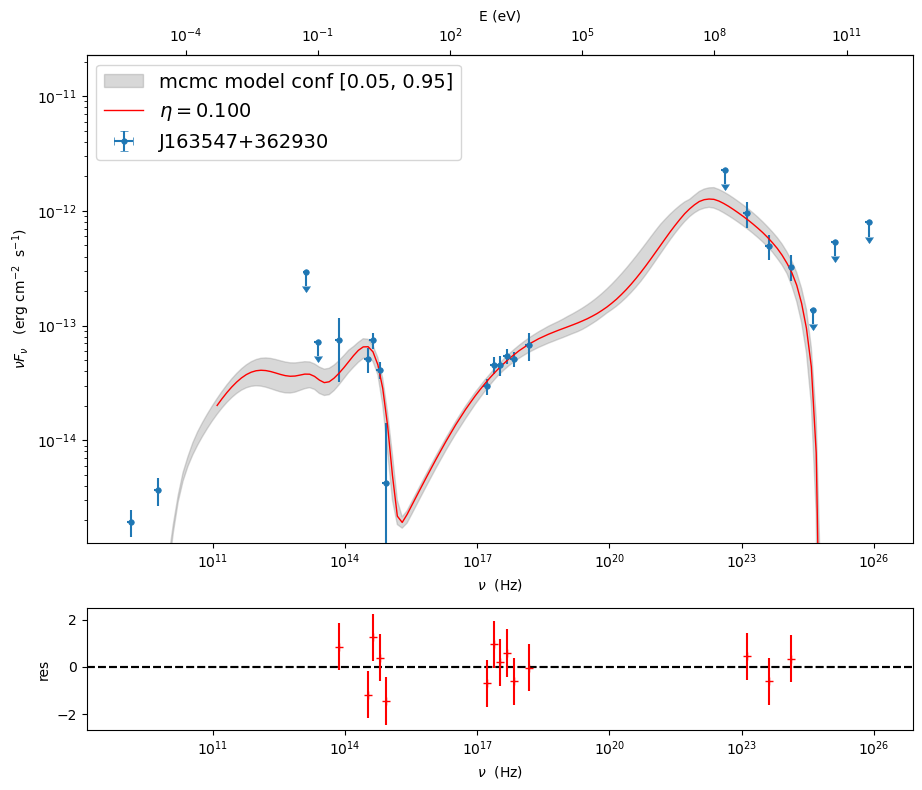

In [58]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_1_2.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

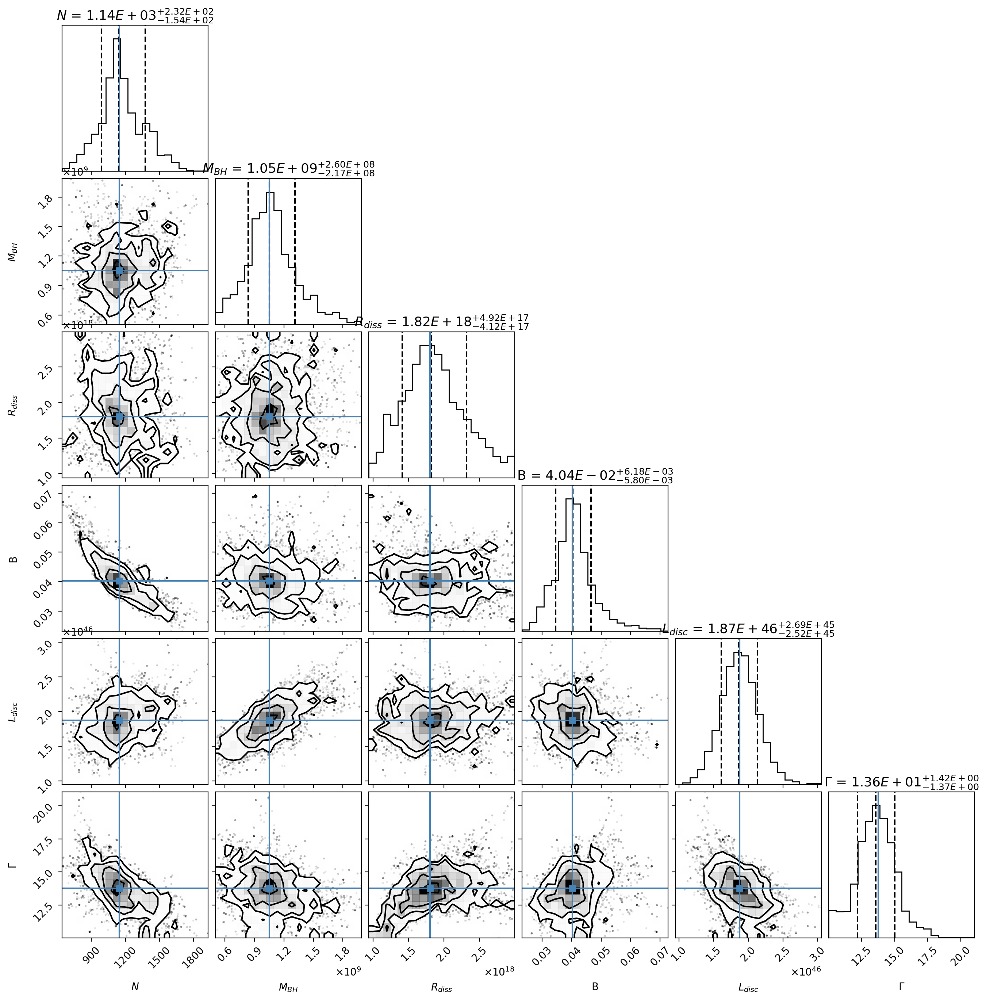

In [59]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_1_2.pkl')

# $\eta=0.150$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2588.17 seconds


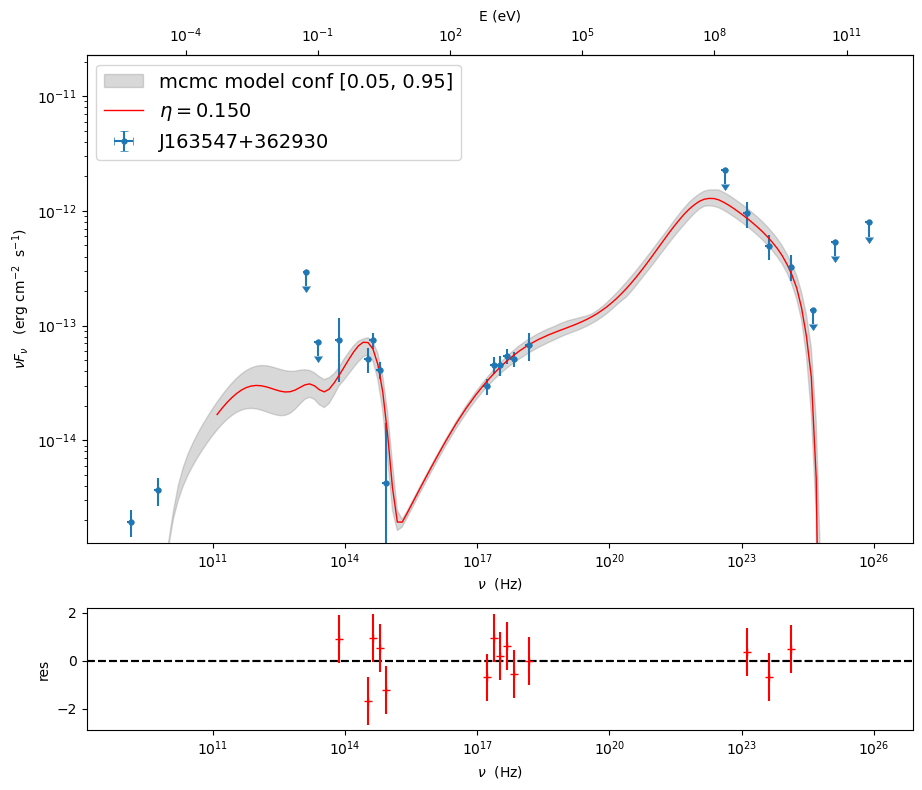

In [60]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_1_5_2.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

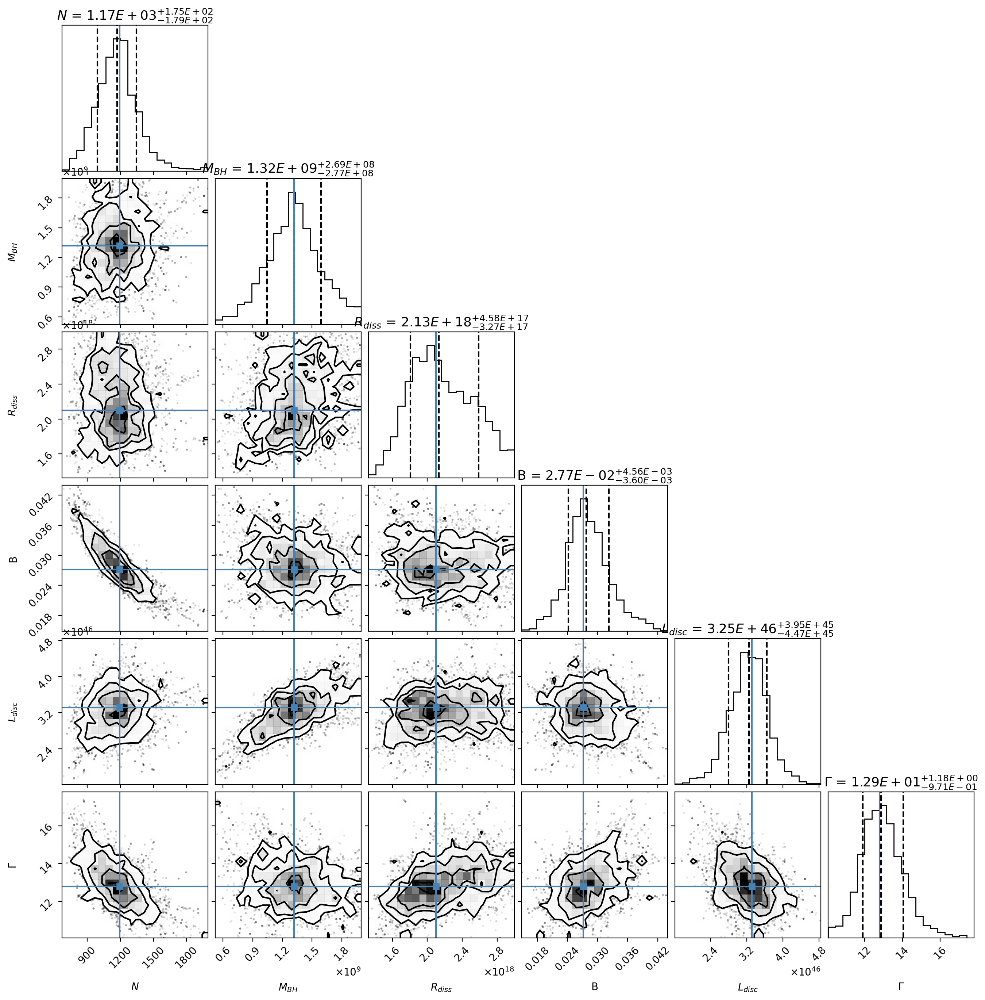

In [61]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_1_5_2.pkl')

# $\eta=0.200$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2589.04 seconds


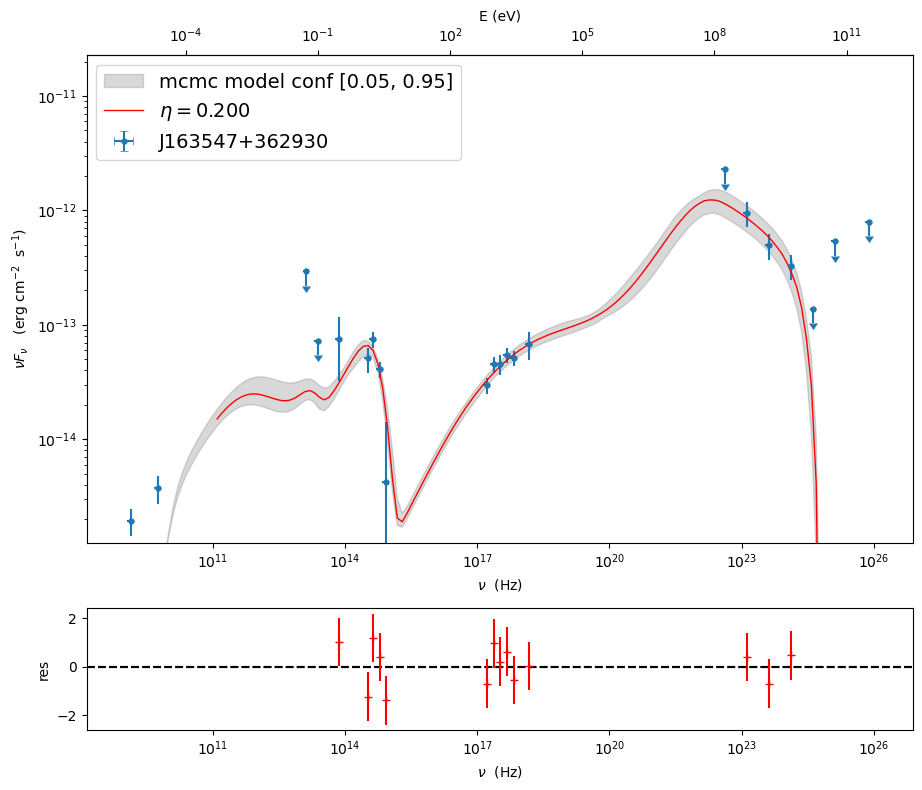

In [62]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_2_2.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

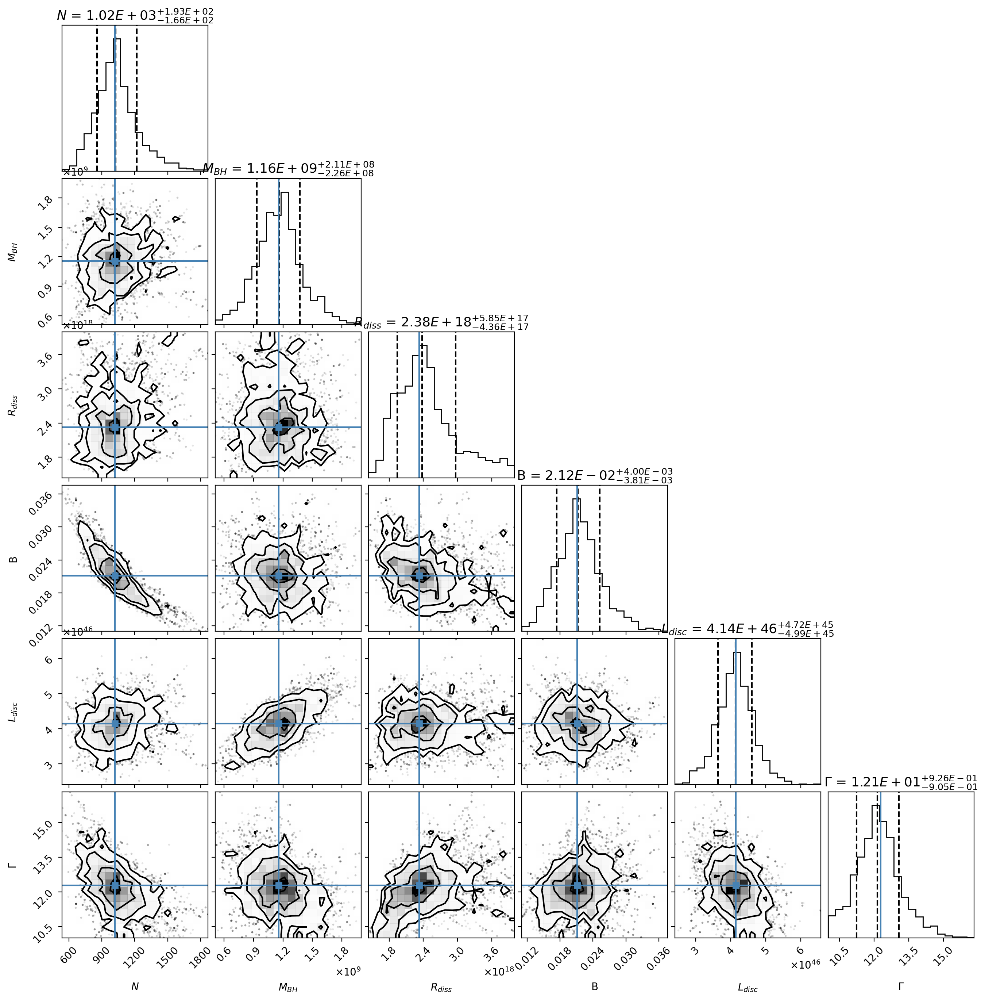

In [63]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_2_2.pkl')

# $\eta=0.300$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2593.95 seconds


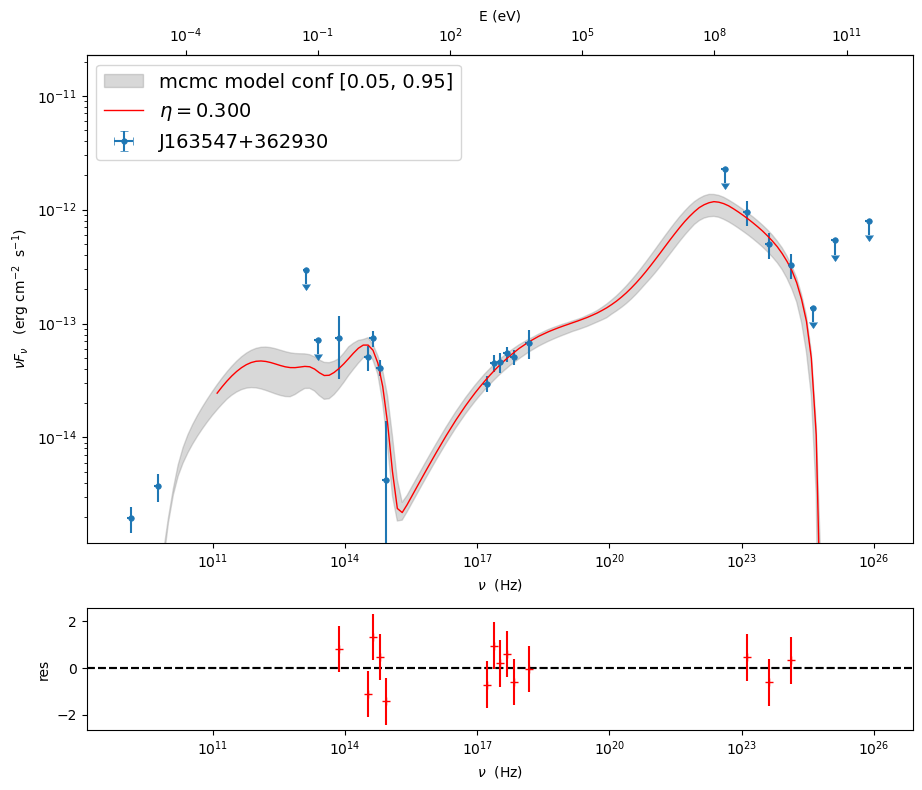

In [64]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_3_2.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

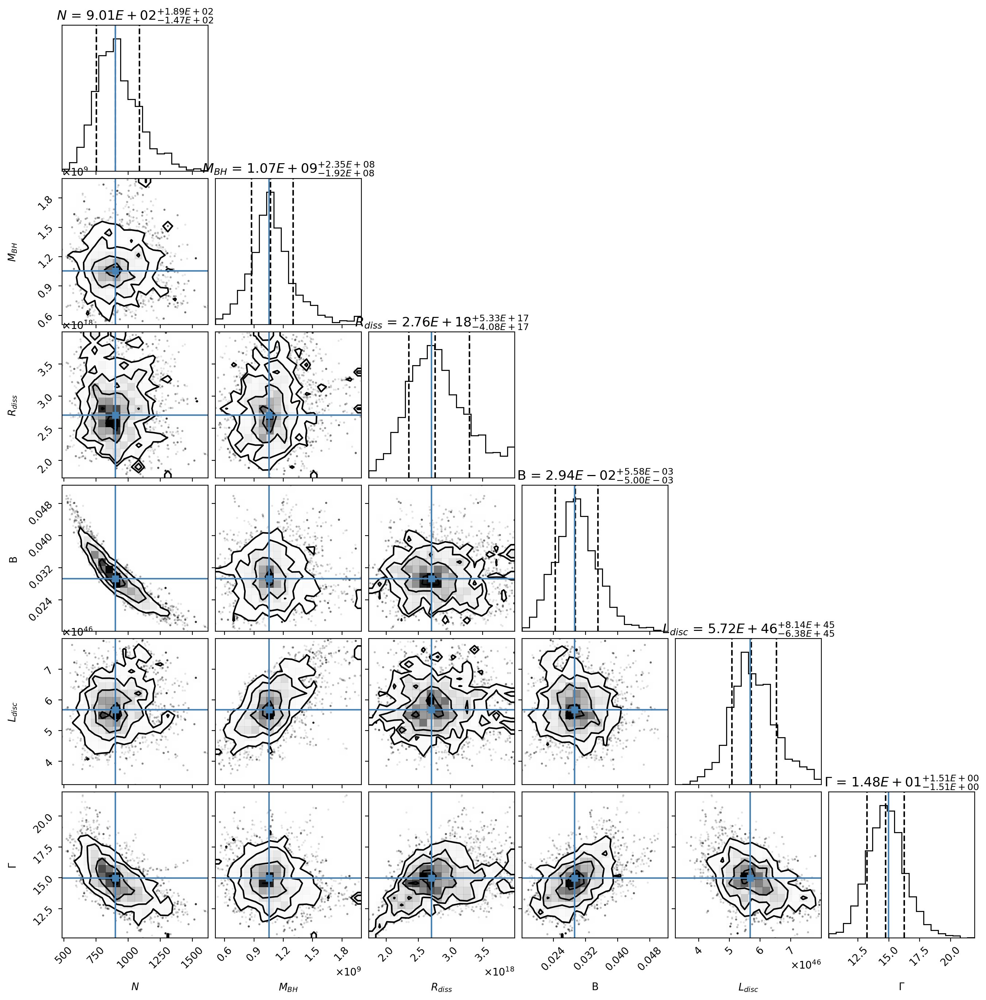

In [65]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_3_2.pkl')